In [235]:
##Import the required libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from pylab import rcParams

In [236]:
# Path to your Excel file
excel_file_path = r'C:\Users\JITENDRA\Downloads\Assignment 4.xlsx'

# Read second tab (Monthly Series) into df2
df = pd.read_excel(excel_file_path, sheet_name='Monthly Series')


df.head(5)

,Month,Series 1
0,1992-01-01,3253
1,1992-02-01,3042
2,1992-03-01,3246
3,1992-04-01,3164
4,1992-05-01,3211


In [237]:
df.tail(5)

,Month,Series 1
199,2008-08-01,9161
200,2008-09-01,8188
201,2008-10-01,7949
202,2008-11-01,10277
203,2008-12-01,13828


In [238]:
df.shape

(204, 2)

In [239]:
# Check for missing values in df1
missing_values = df.isna().sum()

# Display the count of missing values for each column
print("Missing values in df:")
print(missing_values)

Missing values in df:
Month       0
Series 1    0
dtype: int64


In [240]:
# Convert the 'Time' column to a datetime object if it's not already in that format
df['Month'] = pd.to_datetime(df['Month'])

# Set the 'Time' column as the index of the DataFrame
df.set_index('Month', inplace=True)

# Display the updated DataFrame
print("DataFrame after converting 'Month' column to datetime and setting it as index:")
print(df.head())

DataFrame after converting 'Month' column to datetime and setting it as index:
            Series 1
Month               
1992-01-01      3253
1992-02-01      3042
1992-03-01      3246
1992-04-01      3164
1992-05-01      3211


In [241]:
# Plotting the time-series

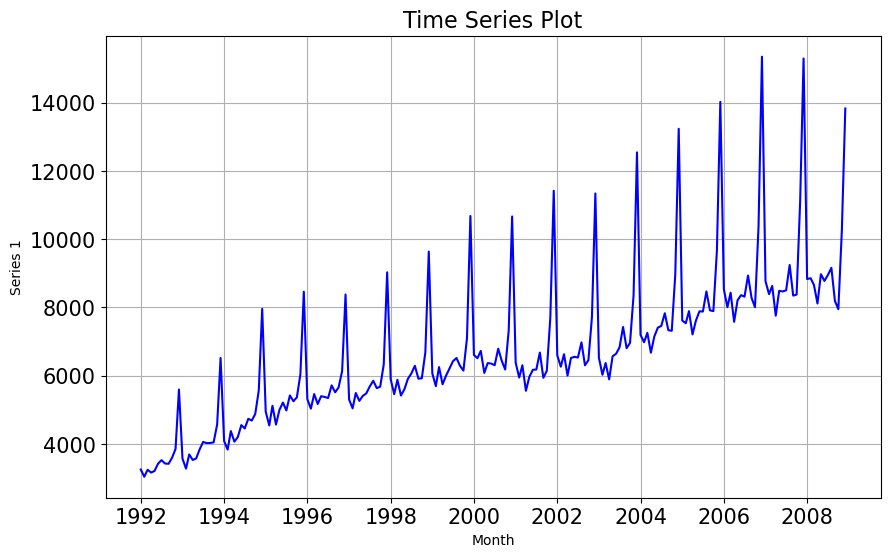

In [242]:
# Plot the time series data
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Series 1'], color='blue')
plt.title('Time Series Plot')
plt.xlabel('Month')
plt.ylabel('Series 1')
plt.grid(True)
plt.show()


In [243]:
round(df.describe(),3)

,Series 1
count,204.000
mean,6699.632
std,2173.442
min,3042.000
25%,5417.250
50%,6363.500
75%,7898.500
max,15344.000


In [244]:
#Series 1  ranges from 3042 unit to 15344.000 unit, hinting huge variation in series 1 across months.

#Mean Value  is 6699.632

In [245]:
#Yearly Boxplot

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


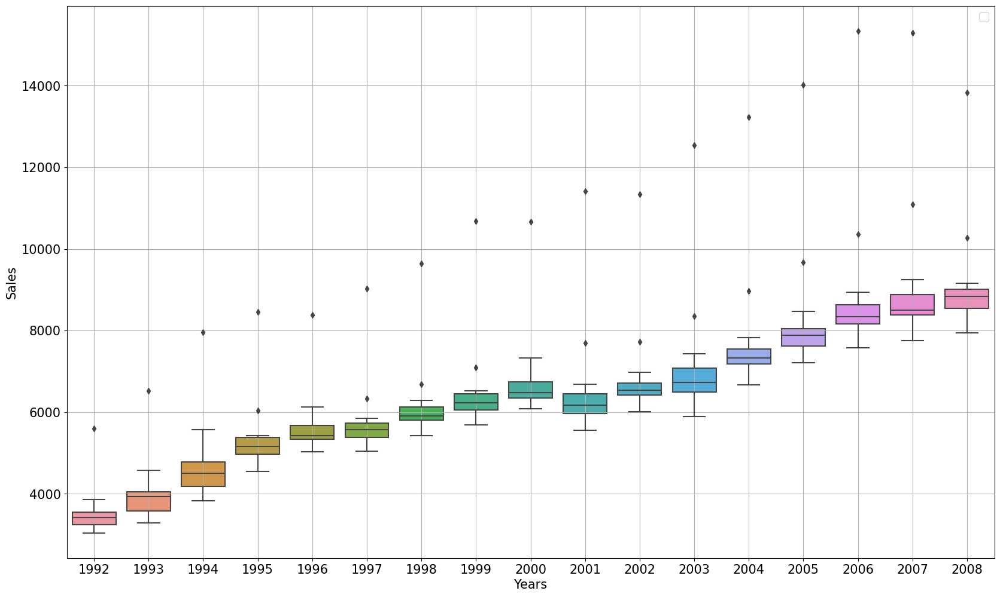

In [246]:
_, ax = plt.subplots(figsize=(20,12))
sns.boxplot(x = df.index.year,y = df.values[:,0],ax=ax)
plt.grid();
plt.xlabel('Years',fontsize=15)
plt.ylabel('Sales',fontsize=15)
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.legend(fontsize="x-large")

In [247]:
#Above plot suggests that series has a significant trend. Every year sales is increasing.

In [248]:
#Monthly Boxplot

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


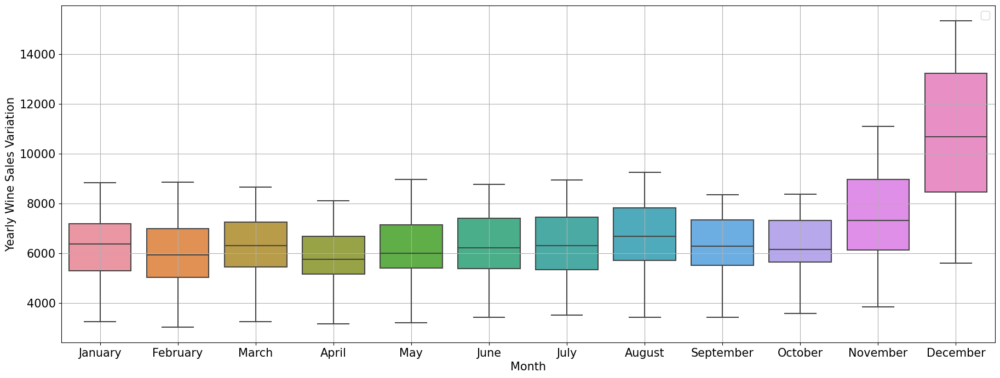

In [249]:
_, ax = plt.subplots(figsize=(22,8))
sns.boxplot(x = df.index.month_name(),y = df.values[:,0],ax=ax)

plt.grid();
plt.xlabel('Month',fontsize=15)
plt.ylabel('Yearly Wine Sales Variation',fontsize=15)
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.legend(fontsize="x-large")

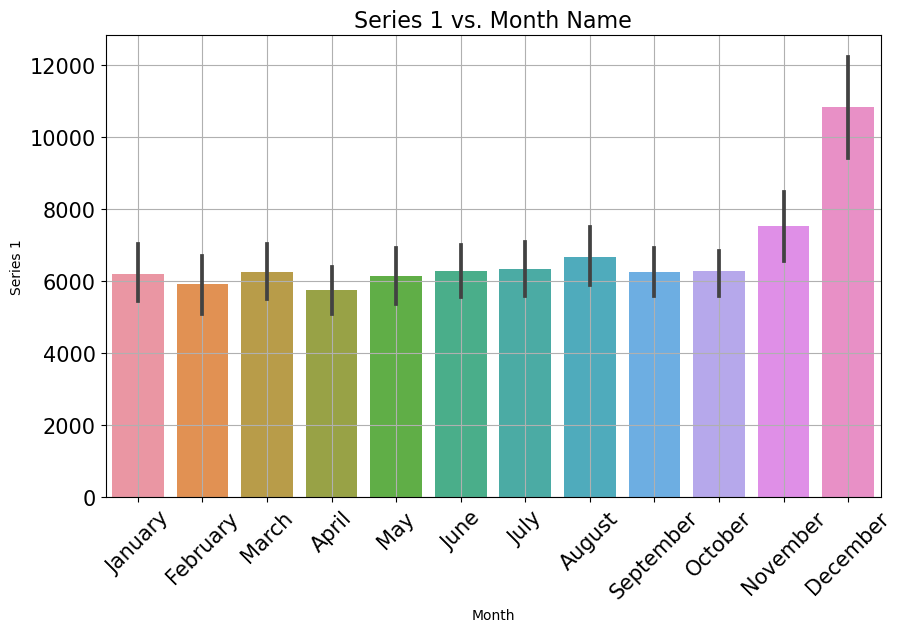

In [250]:
plt.figure(figsize=(10, 6))
sns.barplot(x=df.index.month_name(), y='Series 1', data=df)
plt.title('Series 1 vs. Month Name')
plt.xlabel('Month')
plt.ylabel('Series 1')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()


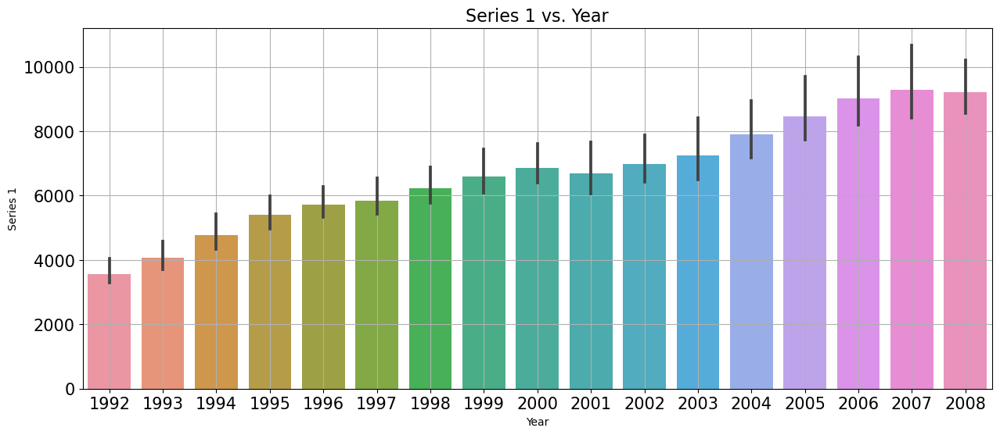

In [251]:
plt.figure(figsize=(15, 6))
sns.barplot(x=df.index.year, y='Series 1', data=df)
plt.title('Series 1 vs. Year')
plt.xlabel('Year')
plt.ylabel('Series 1')
plt.grid(True)
plt.show()


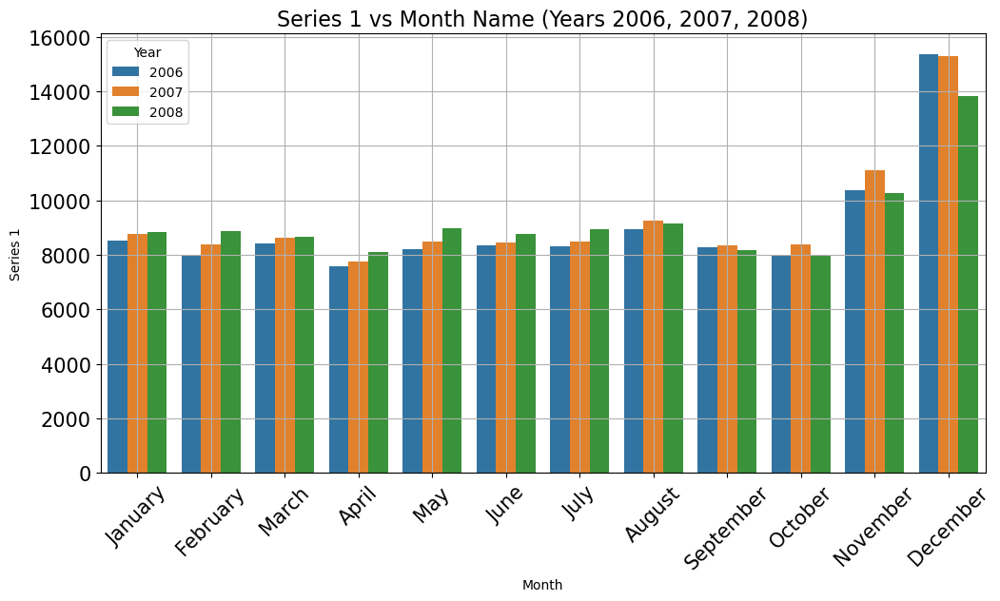

In [252]:
# Filter the DataFrame for the years 2006, 2007, and 2008
df_2006_to_2008 = df[df.index.year.isin([2006, 2007, 2008])]

# Reset the index to make 'Month' a column again
df_2006_to_2008.reset_index(inplace=True)

# Plot the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=df_2006_to_2008, x=df_2006_to_2008['Month'].dt.strftime('%B'), y='Series 1', hue=df_2006_to_2008['Month'].dt.year)
plt.title('Series 1 vs Month Name (Years 2006, 2007, 2008)')
plt.xlabel('Month')
plt.ylabel('Series 1')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Year')
plt.grid(True)
plt.show()


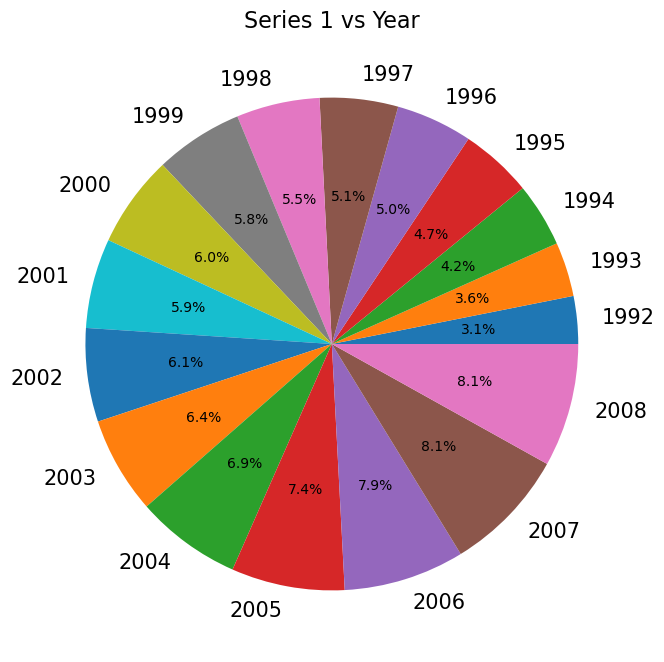

In [253]:
# Group data by year and sum the values of 'Series 1'
yearly_sum = df.groupby(df.index.year)['Series 1'].sum()

# Plot pie chart for Series 1 vs Year
plt.figure(figsize=(8, 8))
plt.pie(yearly_sum, labels=yearly_sum.index, autopct='%1.1f%%')
plt.title('Series 1 vs Year')
plt.show()


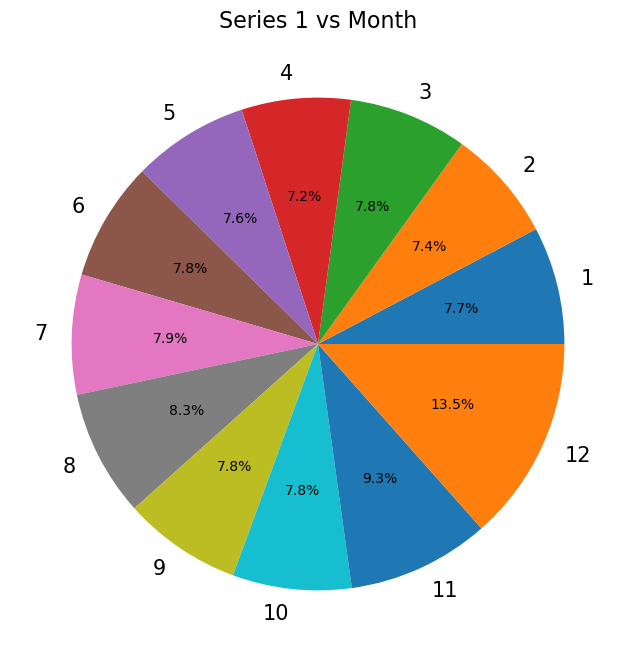

In [254]:
# Group data by month and sum the values of 'Series 1'
monthly_sum = df.groupby(df.index.month)['Series 1'].sum()

# Plot pie chart for Series 1 vs Month
plt.figure(figsize=(8, 8))
plt.pie(monthly_sum, labels=monthly_sum.index, autopct='%1.1f%%')
plt.title('Series 1 vs Month')
plt.show()


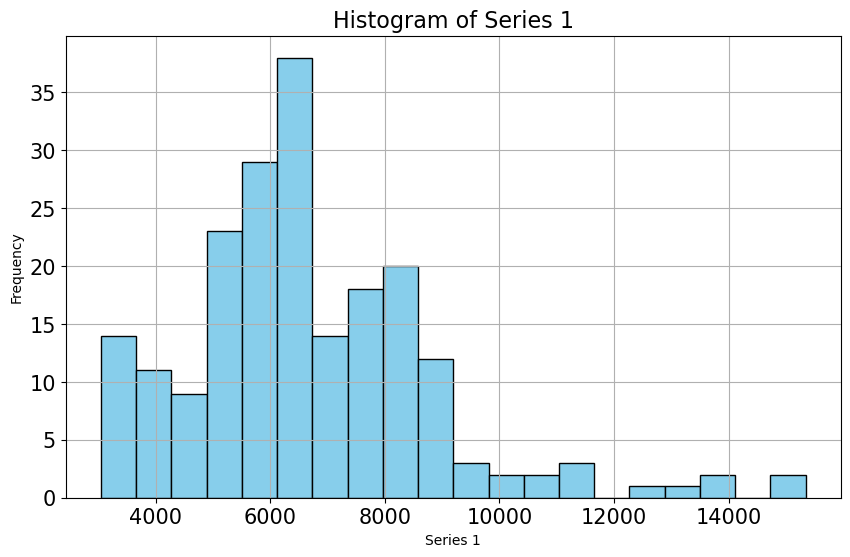

In [255]:
# Plot histogram for Series 1 data
plt.figure(figsize=(10, 6))
plt.hist(df['Series 1'], bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Series 1')
plt.xlabel('Series 1')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


In [256]:
# It appears that we have a seasonal component each year, Also, we see that there are no outliers present.



In [257]:
#Monthly Series 1 across years

In [258]:
monthly_sales_across_years = pd.pivot_table(df, values = 'Series 1', columns = df.index.month_name(), index = df.index.year)
monthly_sales_across_years

Month,April,August,December,February,January,July,June,March,May,November,October,September
Month,,,,,,,,,,,,
1992,3164,3428,5597,3042,3253,3527,3425,3246,3211,3853,3596,3421
1993,3532,4027,6520,3280,3571,4061,3847,3694,3578,4572,4048,4030
1994,4070,4738,7958,3836,4087,4456,4553,4379,4202,5566,4880,4688
1995,4569,5423,8461,4543,4947,4983,5215,5120,4998,6041,5366,5253
1996,5172,5718,8379,5036,5314,5347,5378,5463,5401,6134,5657,5516
1997,5264,5853,9030,5044,5305,5684,5483,5494,5409,6328,5681,5636
1998,5420,6292,9637,5459,5895,6064,5911,5882,5602,6685,5925,5914
1999,5749,6519,10679,5694,6069,6424,6214,6254,5999,7098,6150,6289
2000,6082,6793,10665,6514,6606,6308,6356,6727,6371,7322,6183,6436


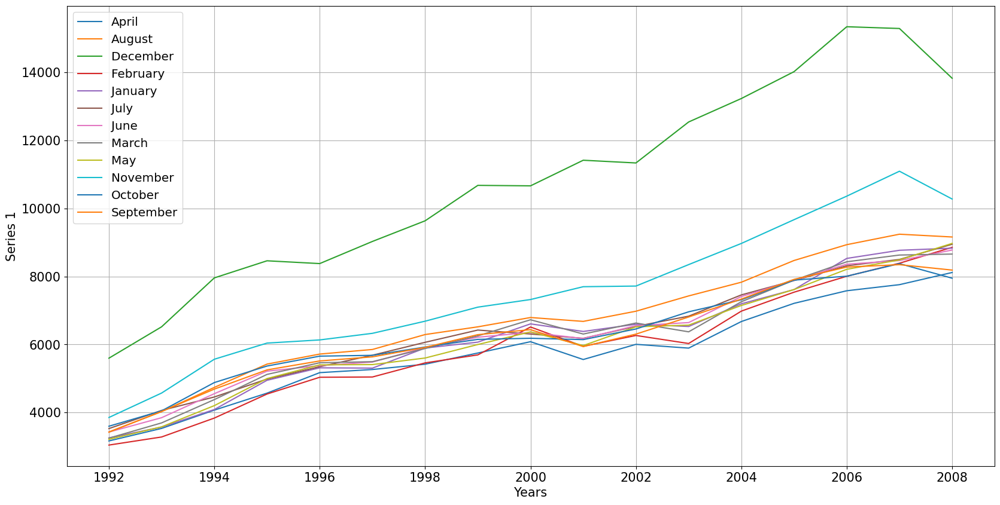

In [259]:
monthly_sales_across_years.plot(figsize=(20,10))
plt.grid()
plt.legend(loc='best');
plt.xlabel('Years',fontsize=15)
plt.ylabel('Series 1',fontsize=15)
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.legend(fontsize="x-large")

In [260]:
# Abovethere is a significant trend seen.

In [261]:
#Quarterly sales across years

In [262]:
quarterly_turnover = pd.pivot_table(df, values = "Series 1", columns = df.index.quarter, index = df.index.year)
quarterly_turnover

Month,1,2,3,4
Month,,,,
1992,3180.333333,3266.666667,3458.666667,4348.666667
1993,3515.000000,3652.333333,4039.333333,5046.666667
1994,4100.666667,4275.000000,4627.333333,6134.666667
1995,4870.000000,4927.333333,5219.666667,6622.666667
1996,5271.000000,5317.000000,5527.000000,6723.333333
1997,5281.000000,5385.333333,5724.333333,7013.000000
1998,5745.333333,5644.333333,6090.000000,7415.666667
1999,6005.666667,5987.333333,6410.666667,7975.666667
2000,6615.666667,6269.666667,6512.333333,8056.666667


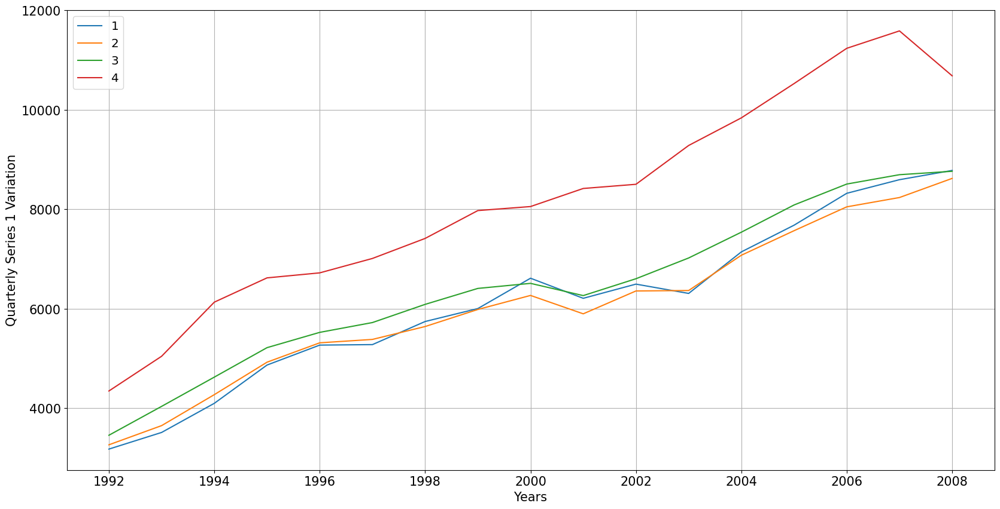

In [263]:
quarterly_turnover.plot(figsize=(20,10))
plt.grid()
plt.legend(loc='best');

plt.xlabel('Years',fontsize=15)
plt.ylabel('Quarterly Series 1 Variation',fontsize=15)
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.legend(fontsize="x-large")

In [264]:
#Q4 IS HIGHEST AMOUNT THEN Q3, Q1, Q2

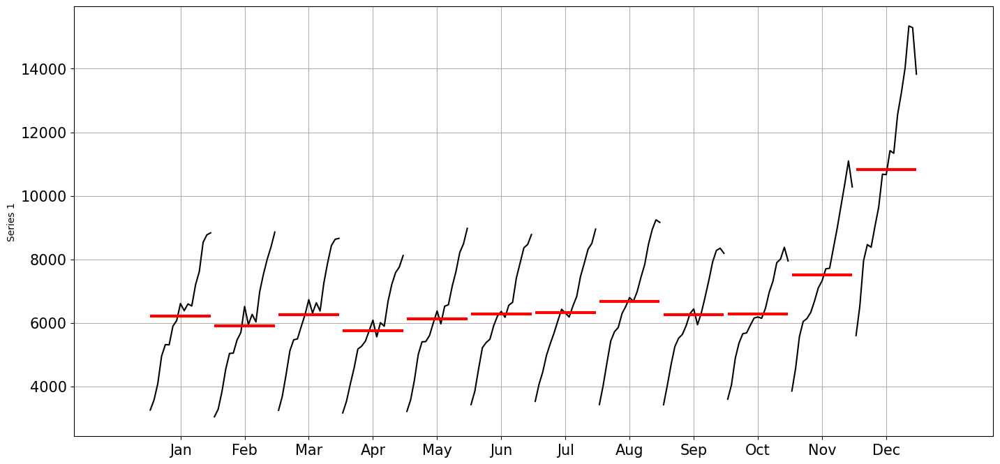

In [265]:
from pylab import rcParams

rcParams['figure.figsize'] =17,8

from statsmodels.graphics.tsaplots import month_plot
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
month_plot(df['Series 1'],ylabel='Series 1')
plt.grid();

# Plotting the Empirical Cumulative Distribution.

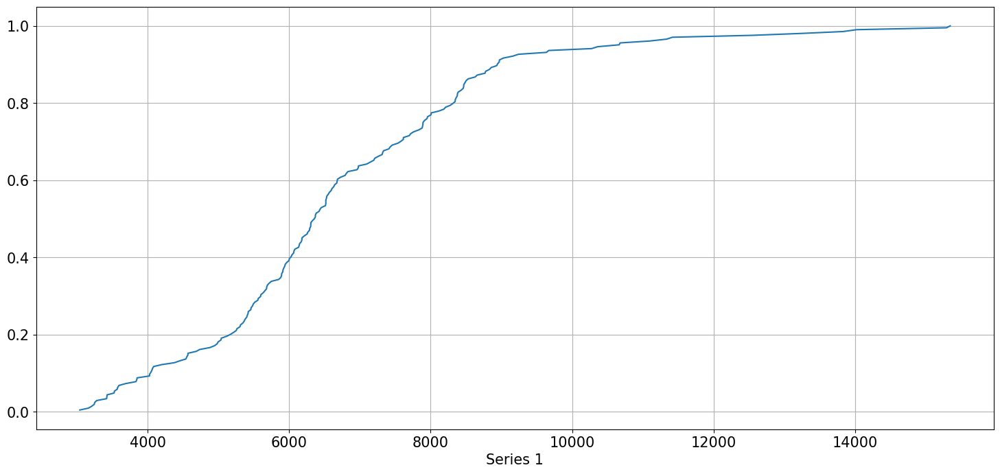

In [266]:
# statistics
from statsmodels.distributions.empirical_distribution import ECDF

plt.figure(figsize = (18, 8))
cdf = ECDF(df['Series 1'])
plt.plot(cdf.x, cdf.y, label = "statmodels");
plt.grid()
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.xlabel('Series 1', fontsize = 15);

# Plot the average Series 1 per month and the month on month percentage change of Series 1.

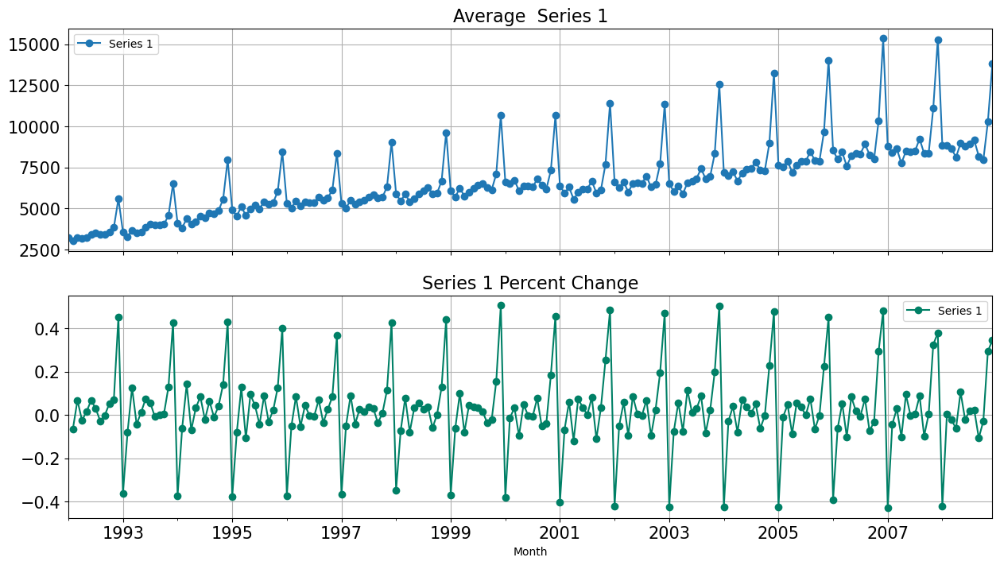

In [267]:
# group by date and get average Customers, and precent change
average    = df.groupby(df.index)["Series 1"].mean()
pct_change = df.groupby(df.index)["Series 1"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,8))

# plot average Customers over time(year-month)
ax1 = average.plot(legend=True,ax=axis1,marker='o',title="Average  Series 1",grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
# plot precent change for Customers over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2,marker='o',colormap="summer",title="Series 1 Percent Change",grid=True)

Plot series 1 for every year

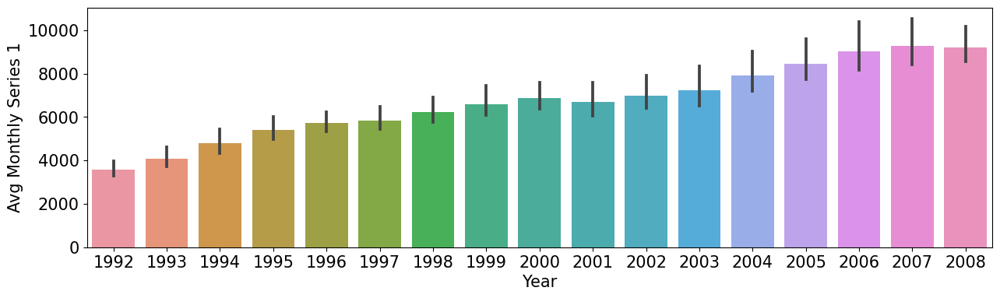

In [268]:
## Plot sales for every year
fig, (axis1) = plt.subplots(1,figsize=(15,4))

sns.barplot(x=df.index.year, y=df.values[:,0], data=df, ax=axis1);
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.xlabel('Year', fontsize = 15);
plt.ylabel('Avg Monthly Series 1', fontsize = 15);

It can be seen that, the average monthly series 1 increases as we move from 1992 to 2008

# Yearly Total Sales

In [269]:
monthly_Series_1_across_years = pd.pivot_table(df, values = 'Series 1', columns = df.index.month_name(), index = df.index.year)
yearly_total_Series_1 = monthly_Series_1_across_years.sum(axis = 1, skipna = True) 
yearly_total_Series_1

Month
1992     42763
1993     48760
1994     57413
1995     64919
1996     68515
1997     70211
1998     74686
1999     79138
2000     82363
2001     80395
2002     83897
2003     86957
2004     94811
2005    101609
2006    108362
2007    111359
2008    110567
dtype: int64

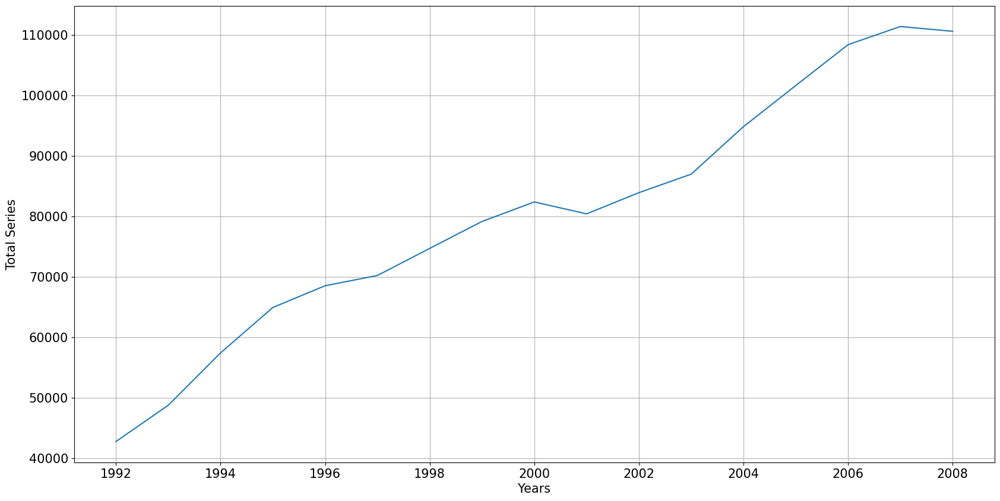

In [270]:
yearly_total_Series_1.plot(figsize=(20,10))
plt.grid()

plt.xlabel('Years',fontsize=15)
plt.ylabel('Total Series',fontsize=15)
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)

In [271]:
df.shape

(204, 1)

# Decomposing the Time Series and plotting the different components.

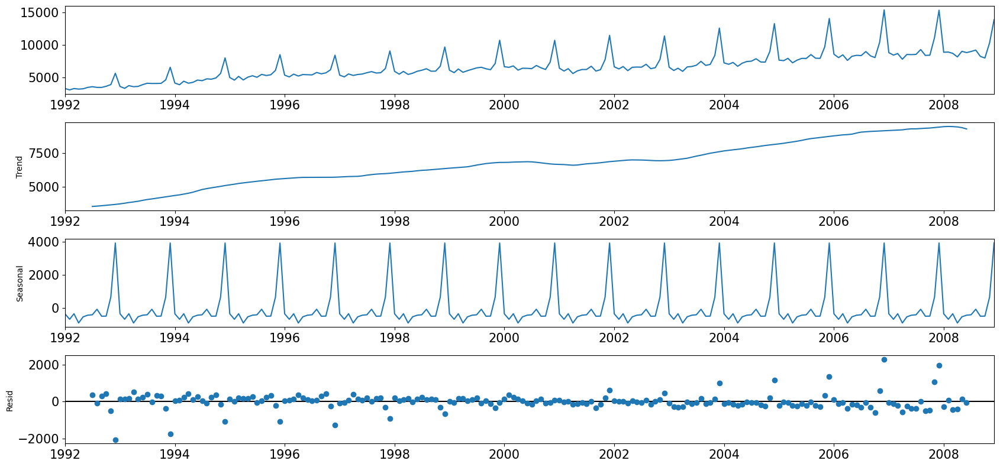

In [272]:
from    statsmodels.tsa.seasonal import   seasonal_decompose
decomposition = seasonal_decompose(df,model='additive')
decomposition.plot();
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16

# Assuming multiplicative decomposition

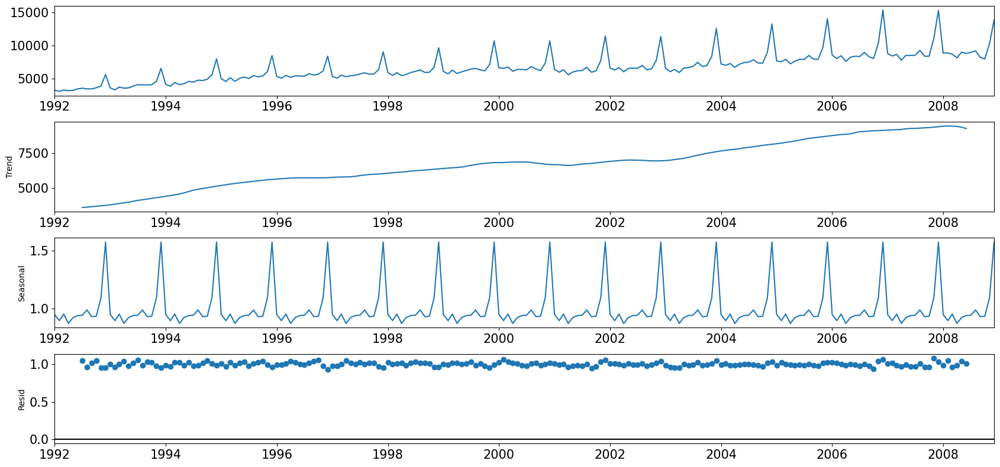

In [273]:
decomposition = seasonal_decompose(df,model='multiplicative')
decomposition.plot();
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16

##### In multiplicative model, We observe that the trend and seasonality are clearly separated and scale of noise is small. In the additive model, there are outliers present in the residual. So series is multiplicative.

In [274]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Month
1992-01-01            NaN
1992-02-01            NaN
1992-03-01            NaN
1992-04-01            NaN
1992-05-01            NaN
1992-06-01            NaN
1992-07-01    3576.833333
1992-08-01    3600.000000
1992-09-01    3628.583333
1992-10-01    3662.583333
1992-11-01    3693.208333
1992-12-01    3726.083333
Name: trend, dtype: float64 

Seasonality 
 Month
1992-01-01    0.949339
1992-02-01    0.896702
1992-03-01    0.952962
1992-04-01    0.872307
1992-05-01    0.922911
1992-06-01    0.940534
1992-07-01    0.943018
1992-08-01    0.988398
1992-09-01    0.930754
1992-10-01    0.934463
1992-11-01    1.093897
1992-12-01    1.574715
Name: seasonal, dtype: float64 

Residual 
 Month
1992-01-01         NaN
1992-02-01         NaN
1992-03-01         NaN
1992-04-01         NaN
1992-05-01         NaN
1992-06-01         NaN
1992-07-01    1.045651
1992-08-01    0.963399
1992-09-01    1.012934
1992-10-01    1.050679
1992-11-01    0.953715
1992-12-01    0.953896
Name: resid, dtype: fl

# Splitting the data into training and test. 70:30

In [275]:
train    =   df[0:int(len(df)*0.7)] 
test     =   df[int(len(df)*0.7):]

In [276]:
train.shape, test.shape

((142, 1), (62, 1))

In [277]:
train.tail()

,Series 1
Month,
2003-06-01,6644
2003-07-01,6832
2003-08-01,7428
2003-09-01,6808
2003-10-01,6961


In [278]:
test.head()

,Series 1
Month,
2003-11-01,8349
2003-12-01,12543
2004-01-01,7197
2004-02-01,6981
2004-03-01,7257


# Building various exponential smoothing models on the training data and evaluate the model using RMSE on the test data.

# Model 1: Linear Regression

For this particular linear regression, we are going to regress the 'Series' variable against the order of the occurrence. For this we need to modify our training data before fitting it into a linear regression.

In [279]:
train_time = [i+1 for i in range(len(train))]
test_time = [i+26 for i in range(len(test))]
print('Training Time instance','\n',train_time)
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142]
Test Time instance 
 [26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87]


In [280]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [281]:
LinearRegression_train['time'] = train_time
LinearRegression_test['time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Series 1  time
Month                     
1992-01-01      3253     1
1992-02-01      3042     2
1992-03-01      3246     3
1992-04-01      3164     4
1992-05-01      3211     5 

Last few rows of Training Data 
             Series 1  time
Month                     
2003-06-01      6644   138
2003-07-01      6832   139
2003-08-01      7428   140
2003-09-01      6808   141
2003-10-01      6961   142 

First few rows of Test Data 
             Series 1  time
Month                     
2003-11-01      8349    26
2003-12-01     12543    27
2004-01-01      7197    28
2004-02-01      6981    29
2004-03-01      7257    30 

Last few rows of Test Data 
             Series 1  time
Month                     
2008-08-01      9161    83
2008-09-01      8188    84
2008-10-01      7949    85
2008-11-01     10277    86
2008-12-01     13828    87 



Now that our training and test data has been modified, let us go ahead use  LINEAR REGRESSION to build the model on the training data and test the model on the test data.

In [282]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Series 1'].values)

LinearRegression()

C:\Users\JITENDRA\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


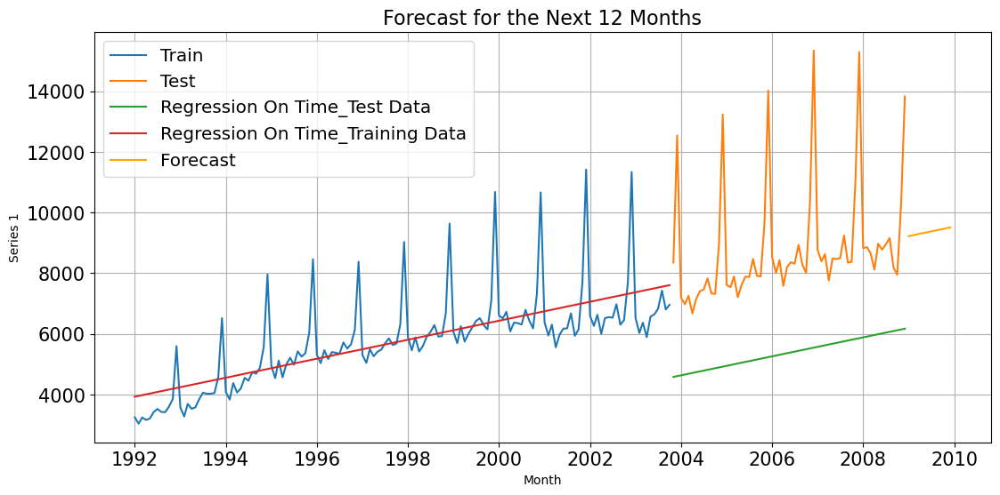

In [290]:
# Extend time instances for forecast
forecast_time = [i + 204 for i in range(12)]

# Predict the values for the forecast period
forecast_values = lr.predict(np.array(forecast_time).reshape(-1, 1))

# Create a DataFrame for the forecast data
forecast_df = pd.DataFrame({'Month': pd.date_range(start='2009-01-01', periods=12, freq='MS'), 'Series 1': forecast_values})

# Add the 'RegOnTime' column to the train DataFrame
LinearRegression_train['RegOnTime'] = lr.predict(LinearRegression_train[['time']])

# Plotting
plt.figure(figsize=(13,6))
plt.plot(train['Series 1'], label='Train')
plt.plot(test['Series 1'], label='Test')
plt.plot(LinearRegression_test.index, LinearRegression_test['RegOnTime'], label='Regression On Time_Test Data')  # Corrected access to 'RegOnTime'
plt.plot(LinearRegression_train.index, LinearRegression_train['RegOnTime'], label='Regression On Time_Training Data')  # Corrected access to 'RegOnTime'
plt.plot(forecast_df['Month'], forecast_df['Series 1'], label='Forecast', color='orange')  # Plotting the forecast
plt.legend(loc='best', fontsize="x-large")
plt.grid()
plt.xlabel('Month')
plt.ylabel('Series 1')
plt.title('Forecast for the Next 12 Months')
plt.show()


# Forecast Next  months

In [293]:
  
from sklearn.linear_model import LinearRegression

# Assuming train and test data are defined previously

# Generate time instances for forecast
forecast_time = [i+313 for i in range(12)]  # Assuming the last training time instance is 312
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='MS')

# Extend the linear regression model
lr_forecast = LinearRegression()

# Concatenate training and test data for extended prediction
extended_data = pd.concat([LinearRegression_train, LinearRegression_test])

# Fit the model to the extended data
lr_forecast.fit(extended_data[['time']], extended_data['Series 1'].values)

# Predict for the next 12 months
forecast_predictions = lr_forecast.predict(np.array(forecast_time).reshape(-1, 1))

# Create a DataFrame to hold the forecast values
forecast_df = pd.DataFrame(forecast_predictions, index=forecast_index, columns=['Forecast'])

# Print the forecast values
print('Forecast for the next 12 months:')
print(forecast_df)


Forecast for the next 12 months:
                Forecast
2009-01-01  11157.781412
2009-02-01  11175.899637
2009-03-01  11194.017862
2009-04-01  11212.136086
2009-05-01  11230.254311
2009-06-01  11248.372536
2009-07-01  11266.490760
2009-08-01  11284.608985
2009-09-01  11302.727210
2009-10-01  11320.845435
2009-11-01  11338.963659
2009-12-01  11357.081884


C:\Users\JITENDRA\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


# Defining the functions for calculating the accuracy metrics.

In [294]:
## Mean Absolute Percentage Error - Function Definition

def MAPE(y, yhat): 
    y, yhat = np.array(y), np.array(yhat)
    try:
        mape =  round(np.sum(np.abs(yhat - y)) / np.sum(y) * 100,2)
    except:
        print("Observed values are empty")
        mape = np.nan
    return mape

# Model1 Evaluation (Linear Regression)

In [295]:
from sklearn.metrics import mean_squared_error

# Calculate RMSE for the RegressionOnTime forecast on the training data
rmse_model1_train = mean_squared_error(train['Series 1'], train_predictions_model1, squared=False)

# Define a function to calculate MAPE
def MAPE(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE for the RegressionOnTime forecast on the training data
mape_model1_train = MAPE(train['Series 1'], train_predictions_model1)

# Print the results
print("For RegressionOnTime forecast on the Training Data, RMSE is %3.3f and MAPE is %3.2f%%" % (rmse_model1_train, mape_model1_train))


For RegressionOnTime forecast on the Training Data, RMSE is 1081.279 and MAPE is 10.69%


In [296]:
from sklearn.metrics import mean_squared_error

# Calculate RMSE for the RegressionOnTime forecast on the training data
rmse_model1_test = mean_squared_error(test['Series 1'], test_predictions_model1, squared=False)

# Define a function to calculate MAPE
def MAPE(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE for the RegressionOnTime forecast on the training data
mape_model1_test = MAPE(test['Series 1'], test_predictions_model1)

# Print the results
print("For RegressionOnTime forecast on the Testing Data, RMSE is %3.3f and MAPE is %3.2f%%" % (rmse_model1_test, mape_model1_test))


For RegressionOnTime forecast on the Testing Data, RMSE is 3907.743 and MAPE is 37.36%


In [297]:
resultsDf = pd.DataFrame({'Model': 'RegressionOnTime',
                                                    'Test RMSE': [rmse_model1_test],
                          'Test MAPE': [mape_model1_test]},
                         index=['Model 1'])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.35823


# Model 2: Naive Approach

For this particular naive model, we say that the prediction for tomorrow is the same as today and the prediction for day after tomorrow is tomorrow and since the prediction of tomorrow is same as today,therefore the prediction for day after tomorrow is also today.¶

In [298]:
NaiveModel_train = train.copy()
NaiveModel_test = test.copy()
## Let us get the last value (or the most recent value) of the training set.

NaiveModel_train['naive'] = np.asarray(train['Series 1'])[len(np.asarray(train['Series 1']))-1]
NaiveModel_train['naive'].head()

Month
1992-01-01    6961
1992-02-01    6961
1992-03-01    6961
1992-04-01    6961
1992-05-01    6961
Name: naive, dtype: int64

In [299]:
NaiveModel_test['naive'] = np.asarray(train['Series 1'])[len(np.asarray(train['Series 1']))-1]
NaiveModel_test['naive'].head()

Month
2003-11-01    6961
2003-12-01    6961
2004-01-01    6961
2004-02-01    6961
2004-03-01    6961
Name: naive, dtype: int64

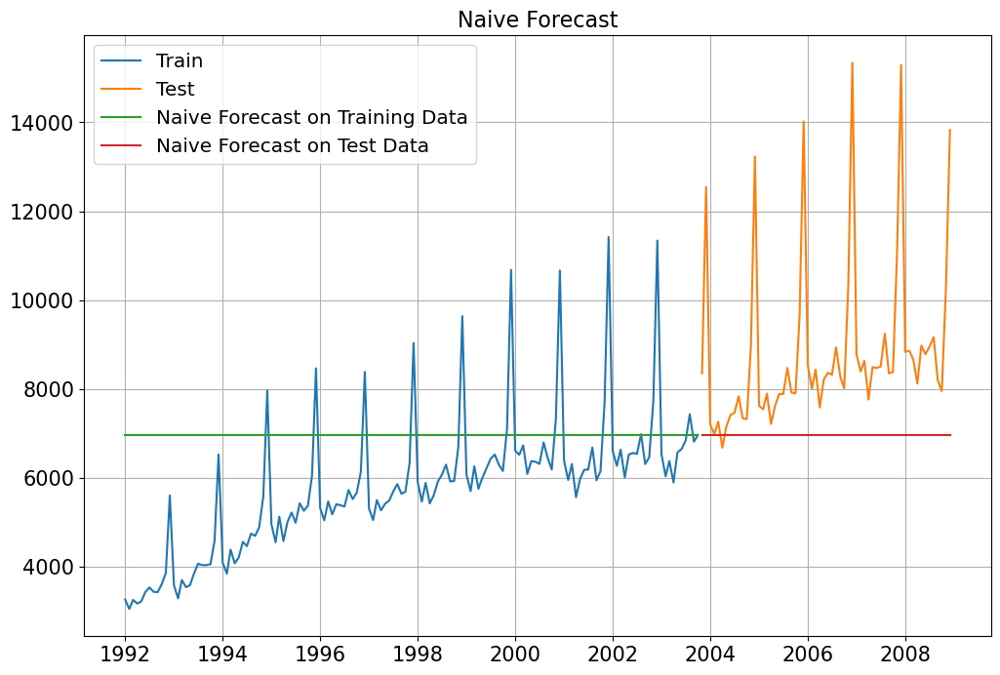

In [300]:
plt.figure(figsize=(12,8))
plt.plot(NaiveModel_train['Series 1'], label='Train')
plt.plot(test['Series 1'], label='Test')
plt.plot(NaiveModel_train['naive'], label='Naive Forecast on Training Data')
plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')
plt.legend(loc='best')
plt.title("Naive Forecast")
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(fontsize="x-large")
plt.grid();

# FORECAST NEXT  12 MONTHS

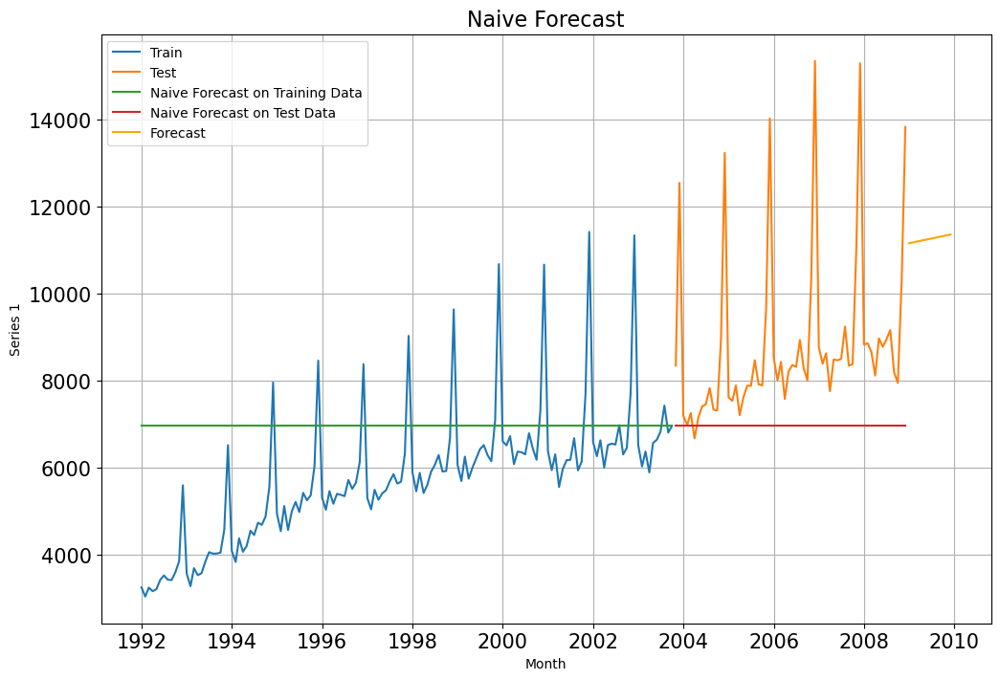

Forecast for the next 12 months:
            Forecast
2009-01-01      6961
2009-02-01      6961
2009-03-01      6961
2009-04-01      6961
2009-05-01      6961
2009-06-01      6961
2009-07-01      6961
2009-08-01      6961
2009-09-01      6961
2009-10-01      6961
2009-11-01      6961
2009-12-01      6961


In [301]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming train and test data are defined previously

# Copying train and test data
NaiveModel_train = train.copy()
NaiveModel_test = test.copy()

# Get the last value (or the most recent value) of the training set
last_value = train['Series 1'].iloc[-1]

# Adding naive forecast column to training and test data
NaiveModel_train['naive'] = last_value
NaiveModel_test['naive'] = last_value

# Plotting the naive forecast
plt.figure(figsize=(12,8))
plt.plot(NaiveModel_train['Series 1'], label='Train')
plt.plot(test['Series 1'], label='Test')
plt.plot(NaiveModel_train['naive'], label='Naive Forecast on Training Data')
plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')
plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast', color='orange')  # Plot forecasted values with a different color
plt.legend(loc='best')
plt.title("Naive Forecast")
plt.xlabel('Month')
plt.ylabel('Series 1')
plt.grid()
plt.show()

# Generating forecast for the next 12 months starting from January 2009
forecast_dates = pd.date_range(start='2009-01-01', periods=12, freq='MS')
forecast_values = [last_value] * 12

# Creating DataFrame to hold forecast values
forecast_df = pd.DataFrame(forecast_values, index=forecast_dates, columns=['Forecast'])

# Print the forecast values
print('Forecast for the next 12 months:')
print(forecast_df)


# Model2 Evaluation (Naive Approach)

In [302]:
from sklearn.metrics import mean_squared_error

# Calculate RMSE for the Naive Model forecast on the training data
rmse_model2_train = mean_squared_error(train['Series 1'], NaiveModel_train['naive'], squared=False)

# Define a function to calculate MAPE
def MAPE(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE for the Naive Model forecast on the training data
mape_model2_train = MAPE(train['Series 1'], NaiveModel_train['naive'])

# Print the results
print("For Naive Model forecast on the Training Data, RMSE is %3.3f and MAPE is %3.2f%%" % (rmse_model2_train, mape_model2_train))


For Naive Model forecast on the Training Data, RMSE is 1932.207 and MAPE is 33.07%


In [303]:
from sklearn.metrics import mean_squared_error

# Calculate RMSE for the Naive Model forecast on the training data
rmse_model2_test = mean_squared_error(test['Series 1'], NaiveModel_test['naive'], squared=False)

# Define a function to calculate MAPE
def MAPE(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE for the Naive Model forecast on the training data
mape_model2_test = MAPE(test['Series 1'], NaiveModel_test['naive'])

# Print the results
print("For Naive Model forecast on the Training Data, RMSE is %3.3f and MAPE is %3.2f%%" % (rmse_model2_test, mape_model2_test))


For Naive Model forecast on the Training Data, RMSE is 2672.231 and MAPE is 18.59%


In [304]:
resultsDf_2 = pd.DataFrame({'Model': 'NaiveModel', 
                                                      
                            'Test RMSE': [rmse_model2_test],
                            'Test MAPE': [mape_model2_test]},index=['Model 2'])

resultsDf = pd.concat([resultsDf, resultsDf_2])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.35823
Model 2,NaiveModel,2672.230680,18.59477


# Model 3: Moving Average(MA)

For the moving average model, we are going to calculate rolling means (or moving averages) for different intervals. The best interval can be determined by the maximum accuracy (or the minimum error) over here.

For Moving Average, we are going to average over the entire data.

In [305]:
MovingAverage = df.copy()
MovingAverage.head()

,Series 1
Month,
1992-01-01,3253
1992-02-01,3042
1992-03-01,3246
1992-04-01,3164
1992-05-01,3211


In [306]:
MovingAverage['Trailing_2'] = MovingAverage['Series 1'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Series 1'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Series 1'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Series 1'].rolling(9).mean()

MovingAverage.head()

,Series 1,Trailing_2,Trailing_4,Trailing_6,Trailing_9
Month,,,,,
1992-01-01,3253,NaN,NaN,NaN,NaN
1992-02-01,3042,3147.5,NaN,NaN,NaN
1992-03-01,3246,3144.0,NaN,NaN,NaN
1992-04-01,3164,3205.0,3176.25,NaN,NaN
1992-05-01,3211,3187.5,3165.75,NaN,NaN


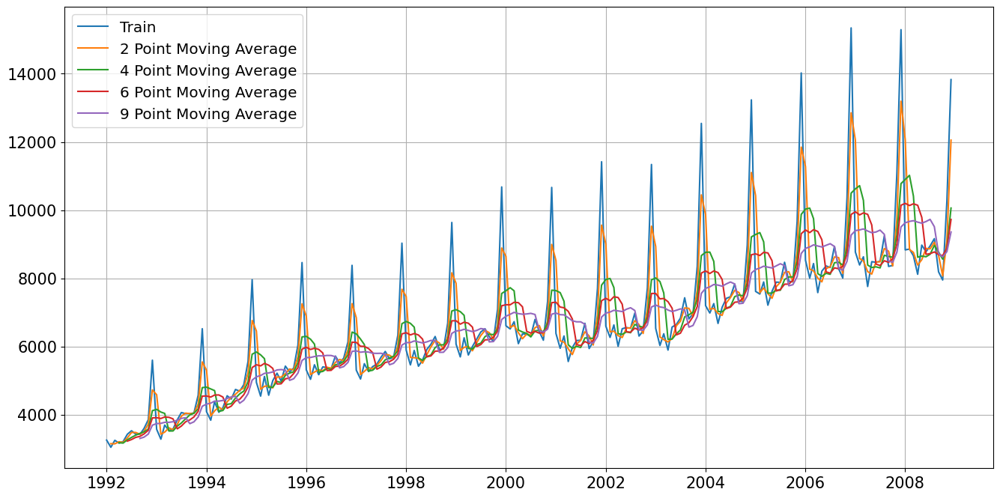

In [307]:
## Plotting on the whole data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage['Series 1'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(loc = 'best')
plt.legend(fontsize="x-large")
plt.grid();

In [308]:
#Creating train and test set 
trailing_MovingAverage_train=MovingAverage[0:int(len(df)*0.7)] 
trailing_MovingAverage_test=MovingAverage[int(len(df)*0.7):]

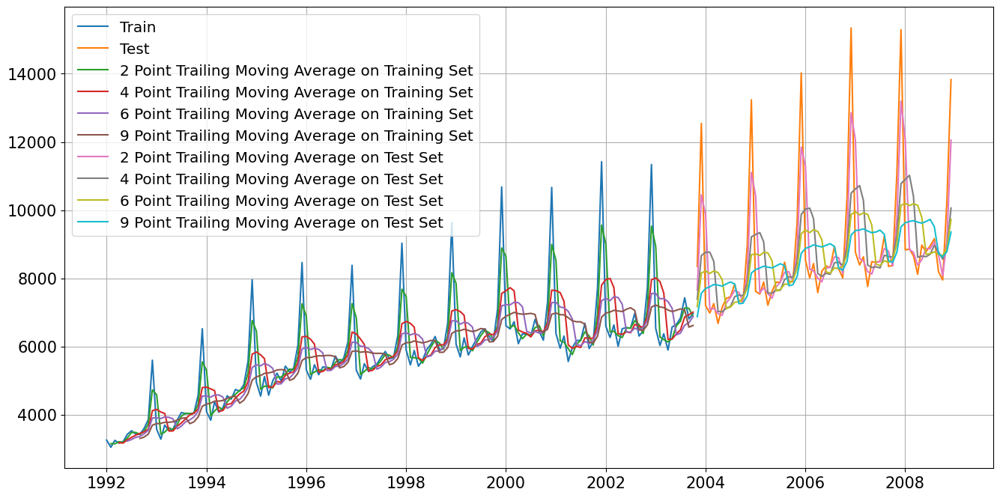

In [309]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train['Series 1'], label='Train')
plt.plot(trailing_MovingAverage_test['Series 1'], label='Test')

plt.plot(trailing_MovingAverage_train['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train['Trailing_4'], label='4 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train['Trailing_6'],label = '6 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train['Trailing_9'],label = '9 Point Trailing Moving Average on Training Set')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')

plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(loc = 'best')
plt.legend(fontsize="x-large")
plt.grid();

# Forecast next 12 Months

Forecast for the next 12 months using trailing moving averages:
            Trailing_4   Trailing_6   Trailing_9  Trailing_2
2009-01-01     10060.5  9725.166667  9357.666667         NaN
2009-02-01     10060.5  9725.166667  9357.666667     10060.5
2009-03-01     10060.5  9725.166667  9357.666667     10060.5
2009-04-01     10060.5  9725.166667  9357.666667     10060.5
2009-05-01     10060.5  9725.166667  9357.666667     10060.5
2009-06-01     10060.5  9725.166667  9357.666667     10060.5
2009-07-01     10060.5  9725.166667  9357.666667     10060.5
2009-08-01     10060.5  9725.166667  9357.666667     10060.5
2009-09-01     10060.5  9725.166667  9357.666667     10060.5
2009-10-01     10060.5  9725.166667  9357.666667     10060.5
2009-11-01     10060.5  9725.166667  9357.666667     10060.5
2009-12-01     10060.5  9725.166667  9357.666667     10060.5


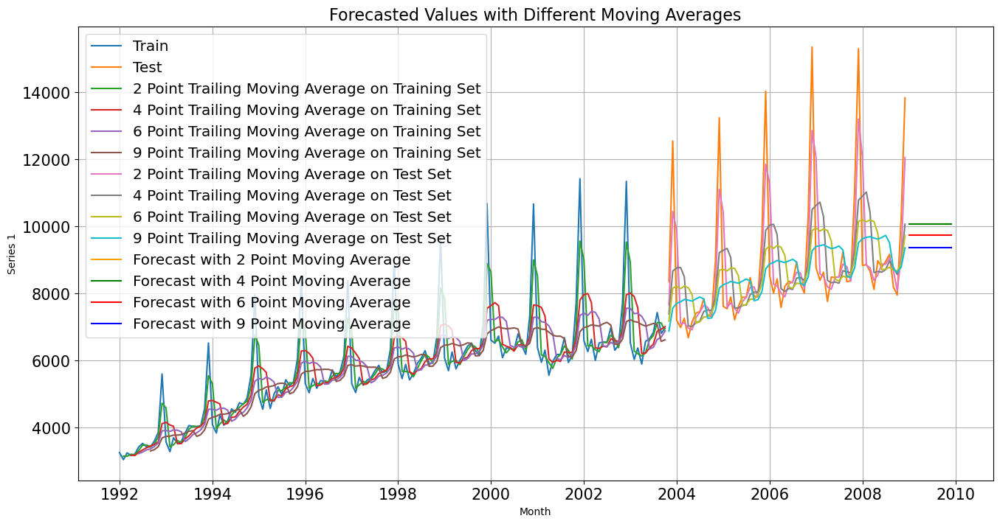

In [314]:
# Assuming trailing_MovingAverage_train and trailing_MovingAverage_test are defined previously

# Generate the forecast index for the next 12 months starting from January 2009
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='MS')

# Get the last calculated moving average values from the test set
last_trailing_2 = trailing_MovingAverage_test['Trailing_2'].iloc[-1]
last_trailing_4 = trailing_MovingAverage_test['Trailing_4'].iloc[-1]
last_trailing_6 = trailing_MovingAverage_test['Trailing_6'].iloc[-1]
last_trailing_9 = trailing_MovingAverage_test['Trailing_9'].iloc[-1]

# Create a DataFrame to hold the forecast values
forecast_df = pd.DataFrame(index=forecast_index)
forecast_df['Trailing_4'] = last_trailing_4
forecast_df['Trailing_6'] = last_trailing_6
forecast_df['Trailing_9'] = last_trailing_9

# Calculate the 2-point trailing moving average for the forecast period
forecast_df['Trailing_2'] = forecast_df['Trailing_4'].rolling(2).mean()

# Print the forecast values
print('Forecast for the next 12 months using trailing moving averages:')
print(forecast_df)

# Plotting the forecasted values with different colors
plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train['Series 1'], label='Train')
plt.plot(trailing_MovingAverage_test['Series 1'], label='Test')
plt.plot(trailing_MovingAverage_train['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train['Trailing_4'], label='4 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train['Trailing_6'], label='6 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train['Trailing_9'], label='9 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'], label='6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'], label='9 Point Trailing Moving Average on Test Set')
plt.plot(forecast_df.index, forecast_df['Trailing_2'], label='Forecast with 2 Point Moving Average', color='orange')
plt.plot(forecast_df.index, forecast_df['Trailing_4'], label='Forecast with 4 Point Moving Average', color='green')
plt.plot(forecast_df.index, forecast_df['Trailing_6'], label='Forecast with 6 Point Moving Average', color='red')
plt.plot(forecast_df.index, forecast_df['Trailing_9'], label='Forecast with 9 Point Moving Average', color='blue')
plt.xlabel('Month')
plt.ylabel('Series 1')
plt.title('Forecasted Values with Different Moving Averages')
plt.legend(loc='best', fontsize="x-large")
plt.grid()
plt.show()


In [315]:
from sklearn.metrics import mean_squared_error

# Test Data - RMSE and MAPE --> 2 point Trailing MA
rmse_model3_test_2 = mean_squared_error(test['Series 1'], trailing_MovingAverage_test['Trailing_2'], squared=False)
mape_model3_test_2 = MAPE(test['Series 1'], trailing_MovingAverage_test['Trailing_2'])
print("For 2 point Moving Average Model forecast on the Test Data, RMSE is %3.3f and MAPE is %3.2f" % (rmse_model3_test_2, mape_model3_test_2))

# Test Data - RMSE and MAPE --> 4 point Trailing MA
rmse_model3_test_4 = mean_squared_error(test['Series 1'], trailing_MovingAverage_test['Trailing_4'], squared=False)
mape_model3_test_4 = MAPE(test['Series 1'], trailing_MovingAverage_test['Trailing_4'])
print("For 4 point Moving Average Model forecast on the Test Data, RMSE is %3.3f and MAPE is %3.2f" % (rmse_model3_test_4, mape_model3_test_4))

# Test Data - RMSE and MAPE --> 6 point Trailing MA
rmse_model3_test_6 = mean_squared_error(test['Series 1'], trailing_MovingAverage_test['Trailing_6'], squared=False)
mape_model3_test_6 = MAPE(test['Series 1'], trailing_MovingAverage_test['Trailing_6'])
print("For 6 point Moving Average Model forecast on the Test Data, RMSE is %3.3f and MAPE is %3.2f" % (rmse_model3_test_6, mape_model3_test_6))

# Test Data - RMSE and MAPE --> 9 point Trailing MA
rmse_model3_test_9 = mean_squared_error(test['Series 1'], trailing_MovingAverage_test['Trailing_9'], squared=False)
mape_model3_test_9 = MAPE(test['Series 1'], trailing_MovingAverage_test['Trailing_9'])
print("For 9 point Moving Average Model forecast on the Test Data, RMSE is %3.3f and MAPE is %3.2f" % (rmse_model3_test_9, mape_model3_test_9))


For 2 point Moving Average Model forecast on the Test Data, RMSE is 1138.287 and MAPE is 7.10
For 4 point Moving Average Model forecast on the Test Data, RMSE is 1644.988 and MAPE is 11.43
For 6 point Moving Average Model forecast on the Test Data, RMSE is 1769.485 and MAPE is 12.40
For 9 point Moving Average Model forecast on the Test Data, RMSE is 1853.125 and MAPE is 11.39


In [316]:
resultsDf_3 = pd.DataFrame({'Model': ['2pointTrailingMovingAverage','4pointTrailingMovingAverage'
                                   ,'6pointTrailingMovingAverage','9pointTrailingMovingAverage'],    
                            'Test RMSE': [rmse_model3_test_2,rmse_model3_test_4
                                          ,rmse_model3_test_6,rmse_model3_test_9]
                            ,'Test MAPE': [mape_model3_test_2,mape_model3_test_4,mape_model3_test_6
                                           ,mape_model3_test_9]}
                           ,index=['Model 3.1','Model 3.2'
                                   ,'Model 3.3','Model 3.4'])

resultsDf = pd.concat([resultsDf, resultsDf_3])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648


# Model 5: Simple Exponential Smoothing

In [93]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
SES_train = train.copy()
SES_test = test.copy()
model_SES = SimpleExpSmoothing(SES_train['Series 1'])
model_SES_autofit = model_SES.fit(optimized=True,use_brute=True)


C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [94]:
model_SES_autofit.params


{'smoothing_level': 0.13278764748426466,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 3255.5295015542115,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [95]:
SES_train['predict'] = model_SES_autofit.fittedvalues
SES_train.head()
len(SES_test)
SES_test['predict'] = model_SES_autofit.forecast(len(SES_test))
SES_test.head()

,Series 1,predict
Month,,
2003-11-01,8349,6893.062578
2003-12-01,12543,6893.062578
2004-01-01,7197,6893.062578
2004-02-01,6981,6893.062578
2004-03-01,7257,6893.062578


# Plotting on both the Training and Test data

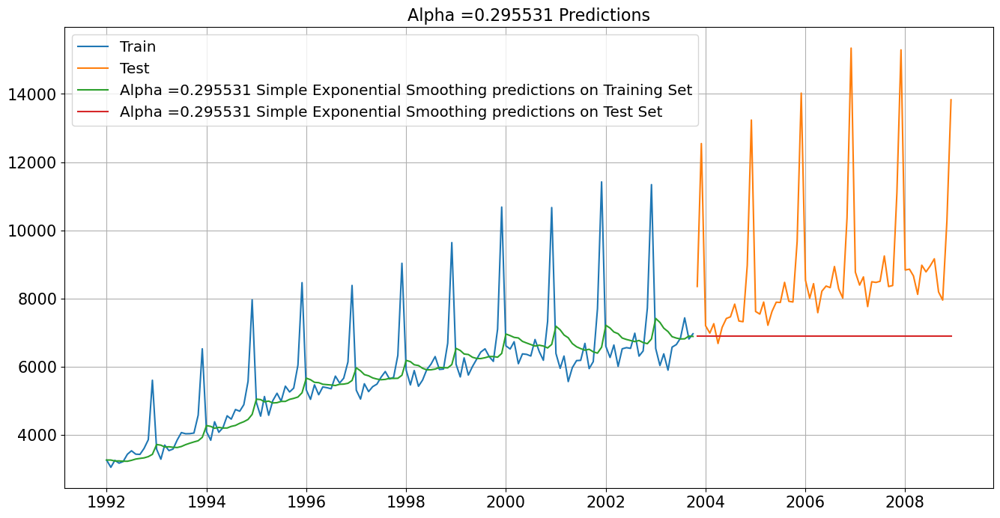

In [96]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(SES_train['Series 1'], label='Train')
plt.plot(SES_test['Series 1'], label='Test')

plt.plot(SES_train['predict'], label='Alpha =0.295531 Simple Exponential Smoothing predictions on Training Set')
plt.plot(SES_test['predict'], label='Alpha =0.295531 Simple Exponential Smoothing predictions on Test Set')
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(loc = 'best')
plt.legend(fontsize="x-large")
plt.grid()
plt.title('Alpha =0.295531 Predictions');

# Forecast the next 12 months

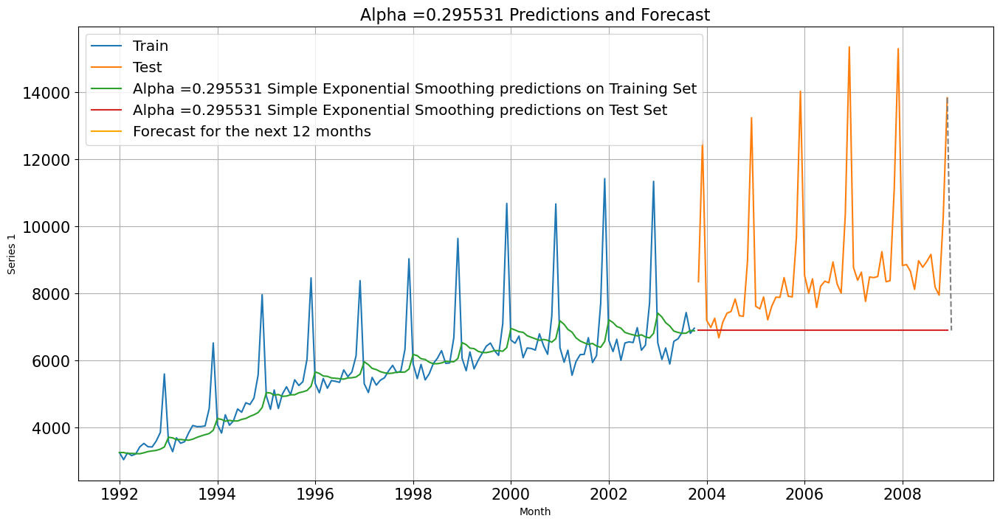

In [321]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

# Assuming SES_train and SES_test are defined previously

# Create a copy of the original data
SES_train_copy = SES_train.copy()
SES_test_copy = SES_test.copy()

# Generate the forecast index for the next 12 months starting from January 2009
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='MS')

# Generate the forecast values for the next 12 months
forecast_values = model_SES_autofit.forecast(12)

# Create a DataFrame to hold the forecast values
forecast_df = pd.DataFrame(forecast_values, index=forecast_index, columns=['Forecast'])

# Plotting on both the Training and Test data
plt.figure(figsize=(16,8))
plt.plot(SES_train['Series 1'], label='Train')
plt.plot(SES_test['Series 1'], label='Test')

plt.plot(SES_train['predict'], label='Alpha =0.295531 Simple Exponential Smoothing predictions on Training Set')
plt.plot(SES_test['predict'], label='Alpha =0.295531 Simple Exponential Smoothing predictions on Test Set')

# Plotting the forecasted values for the next 12 months
plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast for the next 12 months', color='orange')

# Connecting the forecasted values with the real data plot
plt.plot([SES_test.index[-1], forecast_index[0]], [SES_test['Series 1'].iloc[-1], forecast_values[0]], linestyle='--', color='gray')

plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(loc='best', fontsize="x-large")
plt.grid()
plt.title('Alpha =0.295531 Predictions and Forecast')
plt.xlabel('Month')
plt.ylabel('Series 1')
plt.show()


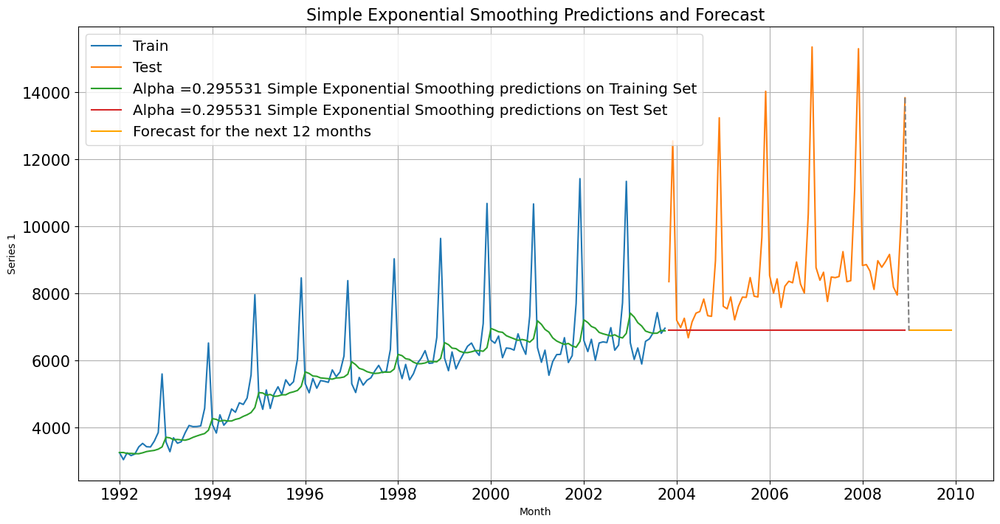

In [324]:
# Plotting on both the Training and Test data
plt.figure(figsize=(16,8))
plt.plot(SES_train['Series 1'], label='Train')
plt.plot(SES_test['Series 1'], label='Test')

plt.plot(SES_train['predict'], label='Alpha =0.295531 Simple Exponential Smoothing predictions on Training Set')
plt.plot(SES_test['predict'], label='Alpha =0.295531 Simple Exponential Smoothing predictions on Test Set')

# Plotting the forecast for the next 12 months
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='MS')
forecast_values = model_SES_autofit.forecast(12)
plt.plot(forecast_index, forecast_values, label='Forecast for the next 12 months', color='orange')

# Connect the last point of the real data with the forecasted data
last_real_data_point = SES_test['Series 1'].iloc[-1]
plt.plot([SES_test.index[-1], forecast_index[0]], [last_real_data_point, forecast_values[0]], linestyle='dashed', color='gray')

plt.xlabel('Month')
plt.ylabel('Series 1')
plt.title('Simple Exponential Smoothing Predictions and Forecast')
plt.legend(loc='best', fontsize="x-large")
plt.grid()
plt.show()


In [325]:
# Forecast the next 12 months
forecast_next_12_months = model_SES_autofit.forecast(steps=12)

# Print the forecasted values for the next 12 months
print("Forecasted values for the next 12 months:")
print(forecast_next_12_months)


Forecasted values for the next 12 months:
2003-11-01    6893.062578
2003-12-01    6893.062578
2004-01-01    6893.062578
2004-02-01    6893.062578
2004-03-01    6893.062578
2004-04-01    6893.062578
2004-05-01    6893.062578
2004-06-01    6893.062578
2004-07-01    6893.062578
2004-08-01    6893.062578
2004-09-01    6893.062578
2004-10-01    6893.062578
Freq: MS, dtype: float64


# Model Evaluation for 𝛼 = 0.295531 : Simple Exponential Smoothing

# RMSE AND MAPE BASED ON TRANING DATA

In [326]:
from sklearn.metrics import mean_squared_error

# Training Data RMSE and MAPE
rmse_model4_train_1 = mean_squared_error(SES_train['Series 1'], SES_train['predict'], squared=False)
mape_model4_train_1 = MAPE(SES_train['Series 1'], SES_train['predict'])
print("For Alpha = 0.295531, Simple Exponential Smoothing Model forecast on the Training Data, RMSE is %3.3f and MAPE is %3.2f" % (rmse_model4_train_1, mape_model4_train_1))


For Alpha = 0.295531, Simple Exponential Smoothing Model forecast on the Training Data, RMSE is 1105.484 and MAPE is 9.12


# RMSE AND MAPE BASED ON TESTING DATA

In [327]:
from sklearn.metrics import mean_squared_error

# Training Data RMSE and MAPE
rmse_model4_test_1 = mean_squared_error(SES_test['Series 1'], SES_test['predict'], squared=False)
mape_model4_test_1 = MAPE(SES_test['Series 1'], SES_test['predict'])
print("For Alpha = 0.295531, Simple Exponential Smoothing Model forecast on the Testing Data, RMSE is %3.3f and MAPE is %3.2f" % (rmse_model4_train_1, mape_model4_train_1))

For Alpha = 0.295531, Simple Exponential Smoothing Model forecast on the Testing Data, RMSE is 1105.484 and MAPE is 9.12


In [328]:
resultsDf_4_1 = pd.DataFrame({'Model': 'Alpha=0.295531,SimpleExponentialSmoothing','Test RMSE': [rmse_model4_test_1],'Test MAPE': [mape_model4_test_1]}
                           ,index=['Model 4.1'])

resultsDf = pd.concat([resultsDf, resultsDf_4_1])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780


###### Setting different alpha values.

Remember, the higher the alpha value more weightage is given to the more recent observation. That means, what happened recently will happen again.

We will run a loop with different alpha values to understand which particular value works best for alpha on the test set.

In [329]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_4_2 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
resultsDf_4_2

,Alpha Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [330]:
from sklearn.metrics import mean_squared_error

resultsDf_4_2 = pd.DataFrame(columns=['Alpha Values', 'Train RMSE', 'Train MAPE', 'Test RMSE', 'Test MAPE'])

for i in np.arange(0.01, 1, 0.01):
    model_SES_alpha_i = model_SES.fit(smoothing_level=i, optimized=False, use_brute=True)
    SES_train['predict', i] = model_SES_alpha_i.fittedvalues
    SES_test['predict', i] = model_SES_alpha_i.forecast(len(SES_test))
    
    rmse_model4_train_i = mean_squared_error(SES_train['Series 1'], SES_train['predict', i], squared=False)
    mape_model4_train_i = MAPE(SES_train['Series 1'], SES_train['predict', i])
    
    rmse_model4_test_i = mean_squared_error(SES_test['Series 1'], SES_test['predict', i], squared=False)
    mape_model4_test_i = MAPE(SES_test['Series 1'], SES_test['predict', i])
    
    resultsDf_4_2 = resultsDf_4_2.append({'Alpha Values': i, 'Train RMSE': rmse_model4_train_i,
                                          'Train MAPE': mape_model4_train_i, 'Test RMSE': rmse_model4_test_i,
                                          'Test MAPE': mape_model4_test_i}, ignore_index=True)


C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\81014021.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_4_2 = resultsDf_4_2.append({'Alpha Values': i, 'Train RMSE': rmse_model4_train_i,
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\81014021.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_4_2 = resultsDf_4_2.append({'Alpha Values': i, 'Train RMSE': rmse_model4_train_i,
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\81014021.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_4_2 = resultsDf_4_2.append({'Alpha Values': i, 'Train RMSE': rmse_model4_train_i,
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\81014021.py:16: FutureWarning: The frame.append method is depre

In [331]:
resultsDf_4_2.sort_values(by = 'Test RMSE')

,Alpha Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
98,0.99,1331.563305,11.981074,2673.259287,18.611264
97,0.98,1327.478672,11.976606,2674.203929,18.626406
96,0.97,1323.449308,11.970465,2675.067069,18.640236
95,0.96,1319.473999,11.963490,2675.851214,18.652797
94,0.95,1315.551578,11.954882,2676.558917,18.664130
...,...,...,...,...,...
4,0.05,1187.758889,10.081418,2776.605577,20.237284
3,0.04,1242.145244,11.117015,2825.994149,20.994802
2,0.03,1340.012628,13.099671,2931.519662,22.610860
1,0.02,1531.773414,17.016877,3183.921772,26.397564


# MODEL 4 , Alpha=0.98,SimpleExponentialSmoothing

###### Plotting on both the Training and Test data 
## Alpha=0.98,SimpleExponentialSmoothing

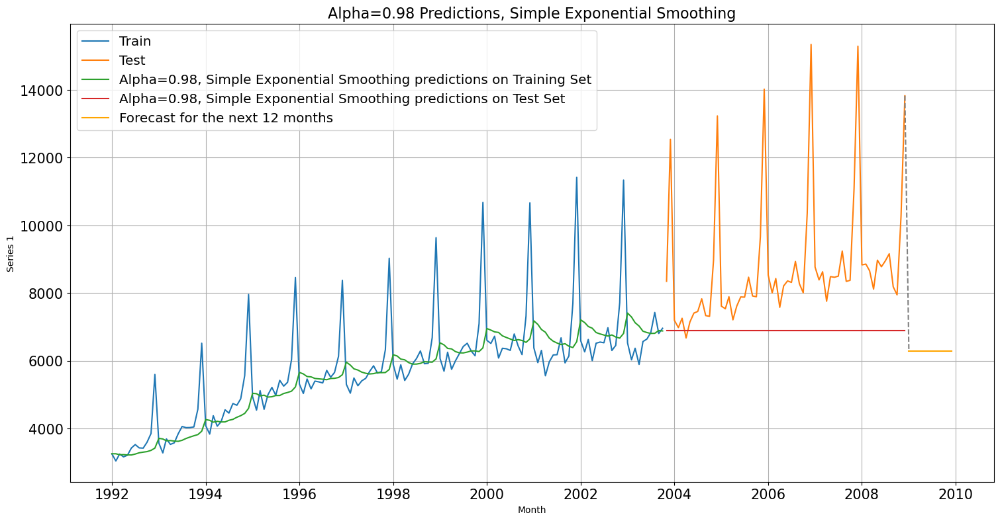

In [334]:
# Plotting on both the Training and Test data
plt.figure(figsize=(18,9))
plt.plot(SES_train['Series 1'], label='Train')
plt.plot(SES_test['Series 1'], label='Test')

plt.plot(SES_train['predict'], label='Alpha=0.98, Simple Exponential Smoothing predictions on Training Set')
plt.plot(SES_test['predict'], label='Alpha=0.98, Simple Exponential Smoothing predictions on Test Set')

# Plotting the forecast for the next 12 months
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='MS')
forecast_values = model_SES_fit.forecast(12)
plt.plot(forecast_index, forecast_values, label='Forecast for the next 12 months', color='orange')

# Connect the last point of the testing data with the forecasted data
last_testing_data_point = SES_test['Series 1'].iloc[-1]
plt.plot([SES_test.index[-1], forecast_index[0]], [last_testing_data_point, forecast_values[0]], linestyle='dashed', color='gray')

plt.xlabel('Month')
plt.ylabel('Series 1')
plt.title('Alpha=0.98 Predictions, Simple Exponential Smoothing')
plt.legend(loc='best', fontsize="x-large")
plt.grid()
plt.show()


# Forecast for the next 12 months

In [336]:
import pandas as pd

# Forecast for the next 12 months
forecast_values = model_SES_fit.forecast(steps=12)

# Generate the forecast index for the next 12 months starting from January 2009
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='MS')

# Create a DataFrame to hold the forecast values
forecast_df = pd.DataFrame(forecast_values, index=forecast_index, columns=['SES Forecast'])

# Print the forecast values
print('Simple Exponential Smoothing Forecast for the next 12 months (Alpha=0.98):')
print(forecast_df)


Simple Exponential Smoothing Forecast for the next 12 months (Alpha=0.98):
            SES Forecast
2009-01-01           NaN
2009-02-01           NaN
2009-03-01           NaN
2009-04-01           NaN
2009-05-01           NaN
2009-06-01           NaN
2009-07-01           NaN
2009-08-01           NaN
2009-09-01           NaN
2009-10-01           NaN
2009-11-01           NaN
2009-12-01           NaN


In [337]:
resultsDf_4_3 = pd.DataFrame({'Model': ['Alpha=0.98,SimpleExponentialSmoothing'],
                                'Test RMSE': [resultsDf_4_2['Test RMSE'][1]]
                            ,'Test MAPE': [resultsDf_4_2['Test MAPE'][1]]}
                           ,index=['Model 4.2'])

resultsDf = pd.concat([resultsDf, resultsDf_4_3])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780
Model 4.2,"Alpha=0.98,SimpleExponentialSmoothing",3183.921772,26.397564


# Model 5: Double Exponential Smoothing (Holt's Model)
Two parameters 𝛼 and 𝛽 are estimated in this model. Level and Trend are accounted for in this model.
                                       

In [338]:
DES_train = train.copy()
DES_test = test.copy()
model_DES = Holt(DES_train['Series 1'])

C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [339]:
model_DES_autofit = model_DES.fit(optimized=True,use_brute=True)
model_DES_autofit.params_formatted

C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


,name,param,optimized
smoothing_level,alpha,0.150321,True
smoothing_trend,beta,0.150321,True
initial_level,l.0,3251.896458,True
initial_trend,b.0,171.153688,True


In [340]:
test_predictions_model5 = model_DES_autofit.forecast(steps=len(test))
test_predictions_model5.head()

2003-11-01    6897.387039
2003-12-01    6887.779412
2004-01-01    6878.171785
2004-02-01    6868.564158
2004-03-01    6858.956532
Freq: MS, dtype: float64

In [341]:
from sklearn.metrics import mean_squared_error

# Calculate RMSE for the Double Exponential Smoothing predictions on the test set
rmse_model5_test = mean_squared_error(DES_test['Series 1'], test_predictions_model5, squared=False)

# Define a function to calculate MAPE
def MAPE(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAPE for the Double Exponential Smoothing predictions on the test set
mape_model5_test = MAPE(DES_test['Series 1'], test_predictions_model5)

# Print the results
print("For Alpha=0.0.526316, Beta=0.526316, Double Exponential Smoothing predictions on Test Set, RMSE is %3.3f and MAPE is %3.2f" % (rmse_model5_test, mape_model5_test))


For Alpha=0.0.526316, Beta=0.526316, Double Exponential Smoothing predictions on Test Set, RMSE is 2970.666 and MAPE is 22.59


In [342]:
resultsDf5_1 = pd.DataFrame({'Model': "Alpha=0.526316,Beta=0.526316:DoubleExponentialSmoothing",'Test RMSE': [rmse_model5_test],'Test MAPE': [mape_model5_test]}
                              ,index=['Model 5.1'])

resultsDf = pd.concat([resultsDf, resultsDf5_1])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780
Model 4.2,"Alpha=0.98,SimpleExponentialSmoothing",3183.921772,26.397564
Model 5.1,"Alpha=0.526316,Beta=0.526316:DoubleExponentialSmoothing",2970.666314,22.589374


Varying the values of Alpha and Beta to get check for lowest test RMSE

In [343]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_5_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
resultsDf_5_2

,Alpha Values,Beta Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [344]:
from sklearn.metrics import mean_squared_error

# Initialize an empty DataFrame to store the results
resultsDf_5_2 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Train RMSE', 'Train MAPE', 'Test RMSE', 'Test MAPE'])

# Loop through alpha and beta values
for i in np.arange(0.01, 1.01, 0.01):
    for j in np.arange(0.01, 1.01, 0.01):
        # Fit the Double Exponential Smoothing model with specified alpha and beta values
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i, smoothing_slope=j, optimized=False, use_brute=True)
        
        # Predictions on training set
        DES_train['predict', i, j] = model_DES_alpha_i_j.fittedvalues
        
        # Predictions on test set
        DES_test['predict', i, j] = model_DES_alpha_i_j.forecast(steps=55)
        
        # Handle NaN values by imputing them with zeros
        DES_train['predict', i, j].fillna(0, inplace=True)
        DES_test['predict', i, j].fillna(0, inplace=True)
        
        # Calculate RMSE and MAPE for training set
        rmse_model5_train = mean_squared_error(DES_train['Series 1'], DES_train['predict', i, j], squared=False)
        mape_model5_train = MAPE(DES_train['Series 1'], DES_train['predict', i, j])
        
        # Calculate RMSE and MAPE for test set
        rmse_model5_test = mean_squared_error(DES_test['Series 1'], DES_test['predict', i, j], squared=False)
        mape_model5_test = MAPE(DES_test['Series 1'], DES_test['predict', i, j])
        
        # Append results to DataFrame
        resultsDf_5_2 = resultsDf_5_2.append({'Alpha Values': i, 'Beta Values': j, 'Train RMSE': rmse_model5_train,
                                              'Train MAPE': mape_model5_train, 'Test RMSE': rmse_model5_test,
                                              'Test MAPE': mape_model5_test}, ignore_index=True)


C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\2997436808.py:10: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  model_DES_alpha_i_j = model_DES.fit(smoothing_level=i, smoothing_slope=j, optimized=False, use_brute=True)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\2997436808.py:31: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_5_2 = resultsDf_5_2.append({'Alpha Values': i, 'Beta Values': j, 'Train RMSE': rmse_model5_train,
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\2997436808.py:10: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  model_DES_alpha_i_j = model_DES.fit(smoothing_level=i, smoothing_slope=j, optimized=False, use_brute=True)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\2997436808.py:31: FutureWarning: The frame.append method is deprecated and will be removed fr

KeyboardInterrupt: 

In [345]:
resultsDf_5_2

,Alpha Values,Beta Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.01,0.01,10492.298751,163.200269,15259.750303,171.688817
1,0.01,0.02,8824.792292,140.341394,8795.056237,97.437098
2,0.01,0.03,7509.068394,120.351324,4839.543005,42.576098
3,0.01,0.04,6503.960973,102.930986,3984.040533,28.739682
4,0.01,0.05,5764.405236,89.316610,4936.635844,47.937916
...,...,...,...,...,...,...
2278,0.23,0.79,1545.900108,19.801244,6269.113787,60.406397
2279,0.23,0.80,1552.599026,19.944625,6604.247236,64.124331
2280,0.23,0.81,1559.190897,20.082570,6959.323309,67.980901
2281,0.23,0.82,1565.664224,20.214659,7333.434943,71.959463


Let us sort the data frame in the ascending ordering of the 'Test RMSE' and the 'Test MAPE' values.

In [346]:
resultsDf_5_2.sort_values(by=['Test RMSE']).head()

,Alpha Values,Beta Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
127,0.02,0.28,1878.097435,27.782175,3705.185632,21.527015
175,0.02,0.76,1339.095263,17.613991,3709.848096,21.036866
203,0.03,0.04,2734.874165,42.503423,3710.949667,23.548749
126,0.02,0.27,1894.918941,27.883076,3712.177519,23.517586
174,0.02,0.75,1346.707495,17.771849,3713.162332,22.143834


C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1404280883.py:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  model_DES_fit = model_DES.fit(smoothing_level=0.18,smoothing_slope=0.68,optimized=False,use_brute=True)


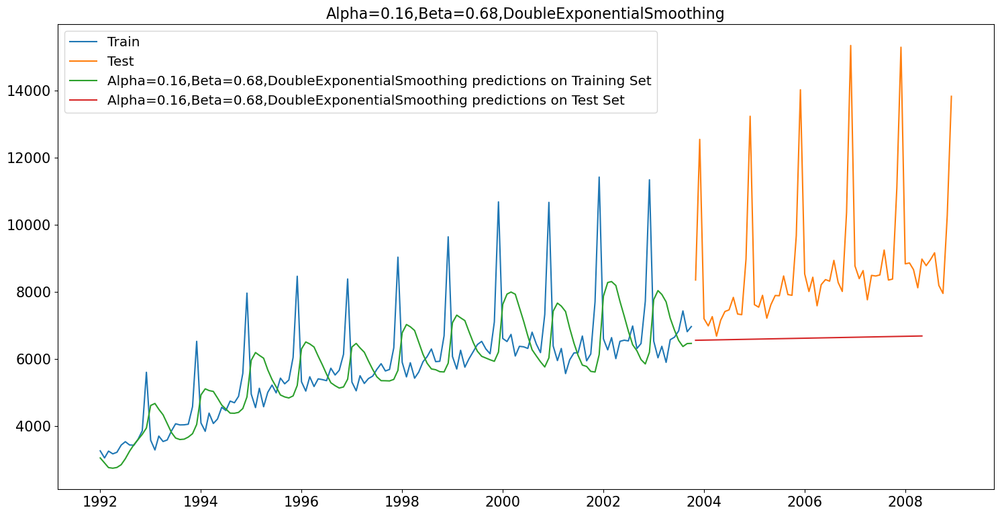

In [135]:
## Plotting on both the Training and Test data 
## Alpha=0.18,Beta=0.68,DoubleExponentialSmoothing

DES_train = train.copy()
DES_test = test.copy()

model_DES = Holt(DES_train['Series 1'])

model_DES_fit = model_DES.fit(smoothing_level=0.18,smoothing_slope=0.68,optimized=False,use_brute=True)

DES_train['predict'] = model_DES_fit.fittedvalues
DES_test['predict'] = model_DES_fit.forecast(steps=55)


plt.figure(figsize=(18,9))
plt.plot(DES_train['Series 1'], label='Train')
plt.plot(DES_test['Series 1'], label='Test')

plt.plot(DES_train['predict'], label='Alpha=0.16,Beta=0.68,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(DES_test['predict'], label='Alpha=0.16,Beta=0.68,DoubleExponentialSmoothing predictions on Test Set')
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(loc = 'best')
plt.legend(fontsize="x-large")
plt.grid()
plt.title('Alpha=0.16,Beta=0.68,DoubleExponentialSmoothing')


plt.grid();

In [136]:
resultsDf_5_3 = pd.DataFrame({'Model': 'Alpha=0.16,Beta=0.68,DoubleExponentialSmoothing',
                              'Test RMSE': [resultsDf_5_2['Test RMSE'].iloc[-1]],
                              'Test MAPE': [resultsDf_5_2['Test MAPE'].iloc[-1]]},
                             index=['Model 5.2'])

resultsDf = pd.concat([resultsDf, resultsDf_5_3])
resultsDf


,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780
Model 4.2,"Alpha=0.98,SimpleExponentialSmoothing",3183.921772,26.397564
Model 5.1,"Alpha=0.526316,Beta=0.526316:DoubleExponential...",2970.666314,22.589374
Model 5.2,"Alpha=0.16,Beta=0.68,DoubleExponentialSmoothing",3979.942590,24.153297


# Model 6: Triple Exponential Smoothing (Holt - Winter's Model)

Three parameters 
alpha, beta, and gamma are estimated in this model. Level, Trend and Seasonality are accounted for in this model.

In [138]:
TES_train = train.copy()
TES_test = test.copy()

In [139]:
from statsmodels.tsa.api import ExponentialSmoothing

# Create the ExponentialSmoothing model without specifying the frequency
model_TES = ExponentialSmoothing(TES_train['Series 1'], trend='additive', seasonal='multiplicative')

# Fit the model
model_TES_autofit = model_TES.fit()


C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


The above fit of the model is by the best parameters that Python thinks for the model. It uses a brute force method to choose the parameters.

In [140]:
model_TES_autofit.params

{'smoothing_level': 0.5353571450411153,
 'smoothing_trend': 0.00010002829686767011,
 'smoothing_seasonal': 0.46464283038976467,
 'damping_trend': nan,
 'initial_level': 3520.8360561182126,
 'initial_trend': 36.892304016116476,
 'initial_seasons': array([0.952152  , 0.88286222, 0.96688321, 0.89880326, 0.92319901,
        0.95724884, 0.99281858, 0.99193562, 0.96941492, 0.99815537,
        1.08258797, 1.53320968]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [141]:
## Prediction on the training data

TES_train['auto_predict'] = model_TES_autofit.fittedvalues
TES_train.head()

,Series 1,auto_predict
Month,,
1992-01-01,3253,3387.498180
1992-02-01,3042,3106.783424
1992-03-01,3246,3400.128980
1992-04-01,3164,3117.156714
1992-05-01,3211,3261.565666


In [142]:
## Prediction on the test data

TES_test['auto_predict'] = model_TES_autofit.forecast(steps=11)
TES_test.head()

,Series 1,auto_predict
Month,,
2003-11-01,8349,8376.370568
2003-12-01,12543,12221.702210
2004-01-01,7197,7084.579577
2004-02-01,6981,6694.156162
2004-03-01,7257,7178.583661


### Plotting on both the Training and Test using autofit
## lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing


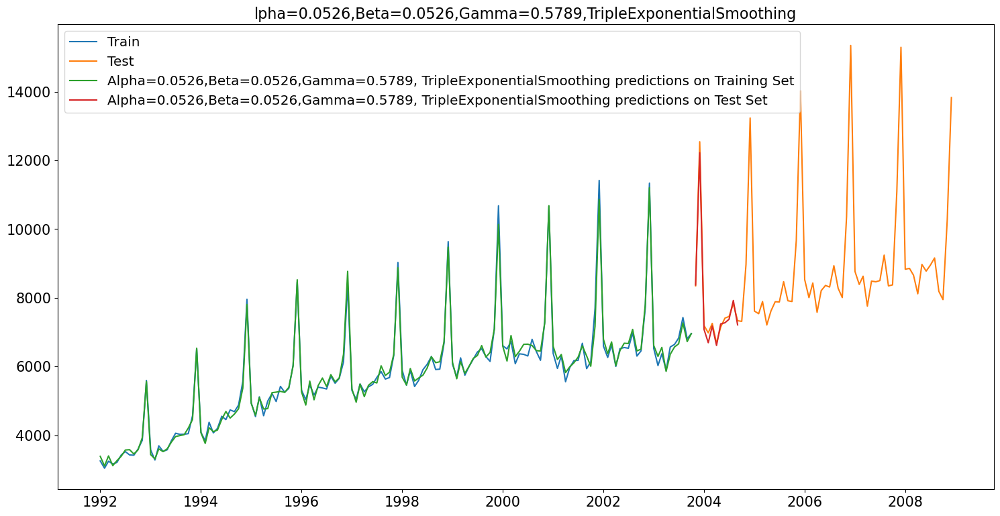

In [144]:
## Plotting on both the Training and Test using autofit
## lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing

plt.figure(figsize=(18,9))
plt.plot(TES_train['Series 1'], label='Train')
plt.plot(TES_test['Series 1'], label='Test')


plt.plot(TES_train['auto_predict'], label='Alpha=0.0526,Beta=0.0526,Gamma=0.5789, TripleExponentialSmoothing predictions on Training Set')
plt.plot(TES_test['auto_predict'], label='Alpha=0.0526,Beta=0.0526,Gamma=0.5789, TripleExponentialSmoothing predictions on Test Set')
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(loc = 'best')
plt.legend(fontsize="x-large")
plt.grid()
plt.title('lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing')


plt.grid();

# Forecast for the next 12 months

In [347]:
# Forecast for the next 12 months
forecast_values = model_TES_autofit.forecast(steps=12)

# Generate the forecast index for the next 12 months starting from January 2009
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='MS')

# Create a DataFrame to hold the forecast values
forecast_df = pd.DataFrame(forecast_values, index=forecast_index, columns=['TES Forecast'])

# Print the forecast values
print('Triple Exponential Smoothing Forecast for the next 12 months:')
print(forecast_df)


Triple Exponential Smoothing Forecast for the next 12 months:
            TES Forecast
2009-01-01           NaN
2009-02-01           NaN
2009-03-01           NaN
2009-04-01           NaN
2009-05-01           NaN
2009-06-01           NaN
2009-07-01           NaN
2009-08-01           NaN
2009-09-01           NaN
2009-10-01           NaN
2009-11-01           NaN
2009-12-01           NaN


In [348]:
from sklearn.metrics import mean_squared_error

# Calculate RMSE for training data
rmse_model6_train_1 = mean_squared_error(TES_train['Series 1'], TES_train['auto_predict'], squared=False)

# Calculate MAPE for training data (assuming MAPE function is defined)
mape_model6_train_1 = MAPE(TES_train['Series 1'], TES_train['auto_predict'])

# Print the results
print("For Alpha=0.0526, Beta=0.0526, Gamma=0.5789, Triple Exponential Smoothing Model forecast on the Training Data, RMSE is %3.3f, MAPE is %3.2f" % (rmse_model6_train_1, mape_model6_train_1))


For Alpha=0.0526, Beta=0.0526, Gamma=0.5789, Triple Exponential Smoothing Model forecast on the Training Data, RMSE is 158.629, MAPE is 2.03


In [349]:
from sklearn.metrics import mean_squared_error

# Drop rows with NaN values in 'auto_predict' column
TES_test_cleaned = TES_test.dropna(subset=['auto_predict'])

# Calculate RMSE for testing data
rmse_model6_test_1 = mean_squared_error(TES_test_cleaned['Series 1'], TES_test_cleaned['auto_predict'], squared=False)

# Calculate MAPE for testing data (assuming MAPE function is defined)
mape_model6_test_1 = MAPE(TES_test_cleaned['Series 1'], TES_test_cleaned['auto_predict'])

# Print the results
print("For Alpha=0.0526, Beta=0.0526, Gamma=0.5789, Triple Exponential Smoothing Model forecast on the Testing Data, RMSE is %3.3f, MAPE is %3.2f" % (rmse_model6_test_1, mape_model6_test_1))


For Alpha=0.0526, Beta=0.0526, Gamma=0.5789, Triple Exponential Smoothing Model forecast on the Testing Data, RMSE is 155.428, MAPE is 1.60


In [350]:
resultsDf_6_1 = pd.DataFrame({'Model': ' lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing','Test RMSE': [rmse_model6_test_1],'Test MAPE':[mape_model6_test_1]}
                           ,index=['Model 6.1'])

resultsDf = pd.concat([resultsDf, resultsDf_6_1])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780
Model 4.2,"Alpha=0.98,SimpleExponentialSmoothing",3183.921772,26.397564
Model 5.1,"Alpha=0.526316,Beta=0.526316:DoubleExponentialSmoothing",2970.666314,22.589374
Model 6.1,"lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing",155.428322,1.600866


### Varying the values of alpha, beta and gamma

In [351]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_6_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
resultsDf_6_2

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [352]:
from sklearn.metrics import mean_squared_error

# Initialize an empty DataFrame to store the results
resultsDf_6_2 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Gamma Values', 'Train RMSE', 'Train MAPE', 'Test RMSE', 'Test MAPE'])

for i in np.arange(0, 1.1, 0.1):
    for j in np.arange(0, 1.1, 0.1):
        for k in np.arange(0, 1.1, 0.1):
            model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i, smoothing_slope=j, smoothing_seasonal=k, optimized=False, use_brute=True)
            TES_train['predict', i, j, k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict', i, j, k] = model_TES_alpha_i_j_k.forecast(steps=11)
        
            # Handle NaN values by imputing them with zeros
            TES_train['predict', i, j, k].fillna(0, inplace=True)
            TES_test['predict', i, j, k].fillna(0, inplace=True)
        
            # Calculate RMSE for training data
            rmse_model6_train = mean_squared_error(TES_train['Series 1'], TES_train['predict', i, j, k], squared=False)
            mape_model6_train = MAPE(TES_train['Series 1'], TES_train['predict', i, j, k])
        
            # Calculate RMSE for testing data
            rmse_model6_test = mean_squared_error(TES_test['Series 1'], TES_test['predict', i, j, k], squared=False)
            mape_model6_test = MAPE(TES_test['Series 1'], TES_test['predict', i, j, k])
        
            # Append results to DataFrame
            resultsDf_6_2 = resultsDf_7_2.append({'Alpha Values': i, 'Beta Values': j, 'Gamma Values': k, 'Train RMSE': rmse_model6_train,
                                                  'Train MAPE': mape_model6_train, 'Test RMSE': rmse_model6_test,
                                                  'Test MAPE': mape_model6_test}, ignore_index=True)


C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\2134323531.py:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i, smoothing_slope=j, smoothing_seasonal=k, optimized=False, use_brute=True)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\2134323531.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_6_2 = resultsDf_7_2.append({'Alpha Values': i, 'Beta Values': j, 'Gamma Values': k, 'Train RMSE': rmse_model6_train,
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\2134323531.py:9: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.
  model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i, smoothing_slope=j, smoothing_seasonal=k, optimized=False, use_brute=True)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\2134323531.py:26: FutureWarn

In [353]:
# from sklearn.metrics import mean_squared_error

# # Initialize an empty DataFrame to store the results
# resultsDf_6_2 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Gamma Values', 'Train RMSE', 'Train MAPE', 'Test RMSE', 'Test MAPE'])

# for i in np.arange(0, 1.1, 0.1):
#     for j in np.arange(0, 1.1, 0.1):
#         for k in np.arange(0, 1.1, 0.1):
#             model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i, smoothing_slope=j, smoothing_seasonal=k, optimized=False, use_brute=True)
#             TES_train['predict', i, j, k] = model_TES_alpha_i_j_k.fittedvalues
#             TES_test['predict', i, j, k] = model_TES_alpha_i_j_k.forecast(steps=11)
            
#             # Check for NaN values in the predicted values
#             if TES_train['predict', i, j, k].isnull().any() or TES_test['predict', i, j, k].isnull().any():
#                 continue
            
#             # Calculate RMSE for training data
#             rmse_model6_train = mean_squared_error(TES_train['Series 1'], TES_train['predict', i, j, k], squared=False)
#             mape_model6_train = MAPE(TES_train['Series 1'], TES_train['predict', i, j, k])
        
#             # Calculate RMSE for testing data
#             rmse_model6_test = mean_squared_error(TES_test['Series 1'], TES_test['predict', i, j, k], squared=False)
#             mape_model6_test = MAPE(TES_test['Series 1'], TES_test['predict', i, j, k])
        
#             # Append results to DataFrame
#             resultsDf_6_2 = resultsDf_6_2.append({'Alpha Values': i, 'Beta Values': j, 'Gamma Values': k, 'Train RMSE': rmse_model6_train,
#                                                   'Train MAPE': mape_model6_train, 'Test RMSE': rmse_model6_test,
#                                                   'Test MAPE': mape_model6_test}, ignore_index=True)


In [354]:
resultsDf_6_2

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.0,0.0,0.0,676.440540,7.860638,8.401098e+03,84.988919
1,0.0,0.0,0.1,585.855935,7.205901,8.392595e+03,84.028580
2,0.0,0.0,0.2,517.117868,6.683345,8.388651e+03,83.307328
3,0.0,0.0,0.3,462.639026,6.207249,8.387031e+03,82.762771
4,0.0,0.0,0.4,420.107682,5.778408,8.386576e+03,82.442501
...,...,...,...,...,...,...,...
1327,1.0,1.0,0.7,180493.254983,735.230082,2.556371e+05,519.955182
1328,1.0,1.0,0.8,184383.524448,668.165690,1.877934e+04,141.335540
1329,1.0,1.0,0.9,123431.959016,634.575781,2.808251e+06,10570.295140
1330,1.0,1.0,1.0,93095.506800,477.404522,9.818208e+03,105.140995


In [355]:
resultsDf_6_2.sort_values(by=['Test RMSE']).head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
26,0.0,0.2,0.4,420.107682,5.778408,8386.575614,82.442501
114,0.0,1.0,0.4,420.107682,5.778408,8386.575614,82.442501
92,0.0,0.8,0.4,420.107682,5.778408,8386.575614,82.442501
4,0.0,0.0,0.4,420.107682,5.778408,8386.575614,82.442501
48,0.0,0.4,0.4,420.107682,5.778408,8386.575614,82.442501


In [356]:
resultsDf_6_2.sort_values(by=['Test MAPE']).head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
37,0.0,0.3,0.4,420.107682,5.778408,8386.575614,82.442501
59,0.0,0.5,0.4,420.107682,5.778408,8386.575614,82.442501
15,0.0,0.1,0.4,420.107682,5.778408,8386.575614,82.442501
26,0.0,0.2,0.4,420.107682,5.778408,8386.575614,82.442501
48,0.0,0.4,0.4,420.107682,5.778408,8386.575614,82.442501


### Plotting on both the Training and Test data using brute force alpha, beta and gamma determination
Alpha=0.1,Beta=0.5,Gamma=0.5,TripleExponentialSmoothing


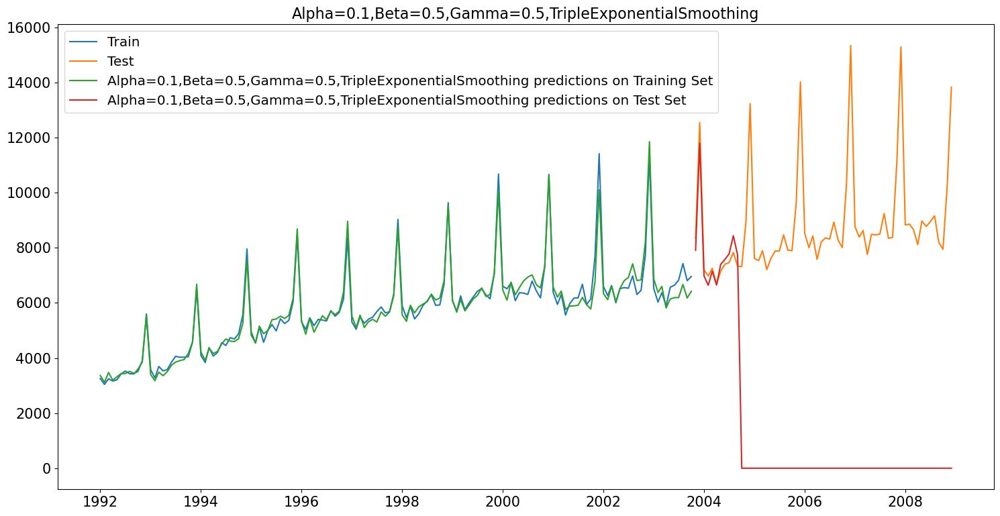

In [360]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination
#Alpha=0.1,Beta=0.5,Gamma=0.5,TripleExponentialSmoothing

plt.figure(figsize=(18,9))
plt.plot(TES_train['Series 1'], label='Train')
plt.plot(TES_test['Series 1'], label='Test')

plt.plot(TES_train['predict', 0.1, 0.5, 0.5], label='Alpha=0.1,Beta=0.5,Gamma=0.5,TripleExponentialSmoothing predictions on Training Set')
#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.1, 0.5, 0.5], label='Alpha=0.1,Beta=0.5,Gamma=0.5,TripleExponentialSmoothing predictions on Test Set')

plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(loc = 'best')
plt.legend(fontsize="x-large")
plt.grid()
plt.title('Alpha=0.1,Beta=0.5,Gamma=0.5,TripleExponentialSmoothing')
plt.grid();

In [361]:
resultsDf_6_3 = pd.DataFrame({'Model': 'Alpha=0.1,Beta=0.5,Gamma=0.5,TripleExponentialSmoothing','Test RMSE': [resultsDf_6_2['Test RMSE'][181]],'Test MAPE':[resultsDf_6_2['Test MAPE'][181]]}
                           ,index=['Model 6.2'])

resultsDf = pd.concat([resultsDf, resultsDf_6_3])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780
Model 4.2,"Alpha=0.98,SimpleExponentialSmoothing",3183.921772,26.397564
Model 5.1,"Alpha=0.526316,Beta=0.526316:DoubleExponentialSmoothing",2970.666314,22.589374
Model 6.1,"lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing",155.428322,1.600866


In [362]:
if not resultsDf_6_2.empty and len(resultsDf_6_2) >= 182:
    resultsDf_6_3 = pd.DataFrame({'Model': 'Alpha=0.1, Beta=0.5, Gamma=0.5, Triple Exponential Smoothing',
                                   'Test RMSE': [resultsDf_7_2['Test RMSE'].iloc[181]],
                                   'Test MAPE': [resultsDf_7_2['Test MAPE'].iloc[181]]},
                                  index=['Model 6.2'])

    resultsDf = pd.concat([resultsDf, resultsDf_6_3])
    resultsDf
else:
    print("Error: Unable to retrieve results for Model 6.2")


Checking for the stationarity of the data at alpha = 0.05.

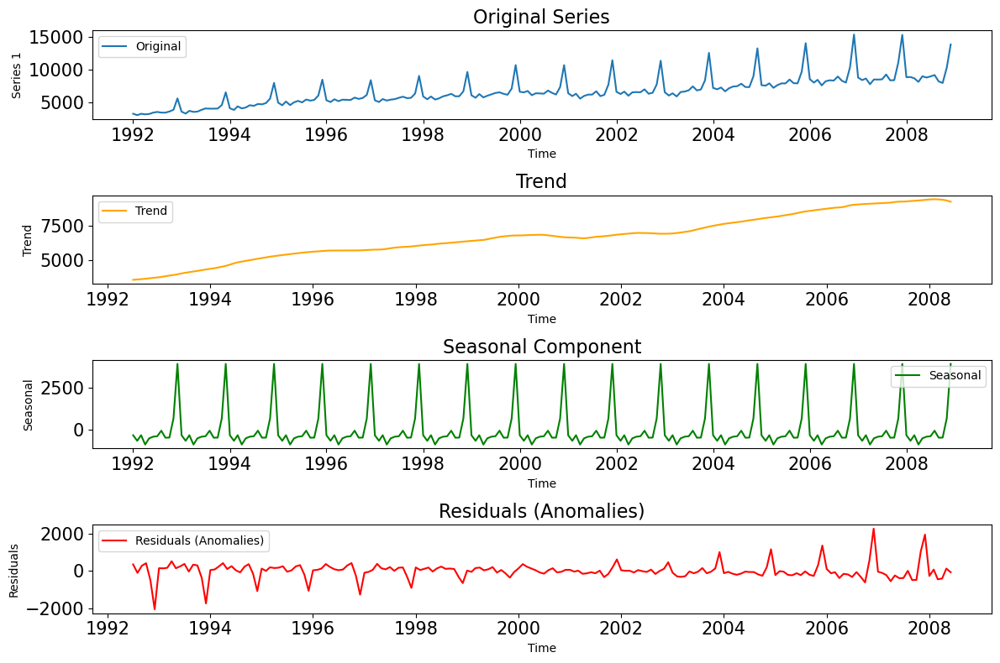

In [363]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Perform seasonal decomposition
result = seasonal_decompose(df['Series 1'], model='additive', period=12)  # Assuming quarterly seasonality (period=12)

# Plot the decomposition components
plt.figure(figsize=(12, 8))

# Original series
plt.subplot(4, 1, 1)
plt.plot(df.index, df['Series 1'], label='Original')
plt.title('Original Series')
plt.xlabel('Time')
plt.ylabel('Series 1')
plt.legend()

# Trend component
plt.subplot(4, 1, 2)
plt.plot(df.index, result.trend, label='Trend', color='orange')
plt.title('Trend')
plt.xlabel('Time')
plt.ylabel('Trend')
plt.legend()

# Seasonal component
plt.subplot(4, 1, 3)
plt.plot(df.index, result.seasonal, label='Seasonal', color='green')
plt.title('Seasonal Component')
plt.xlabel('Time')
plt.ylabel('Seasonal')
plt.legend()

# Residuals (Anomalies) component
plt.subplot(4, 1, 4)
plt.plot(df.index, result.resid, label='Residuals (Anomalies)', color='red')
plt.title('Residuals (Anomalies)')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.legend()

plt.tight_layout()
plt.show()


In [364]:
## Test for stationarity of the series - Dicky Fuller test

from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=12).mean()
    rolstd = timeseries.rolling(window=12).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

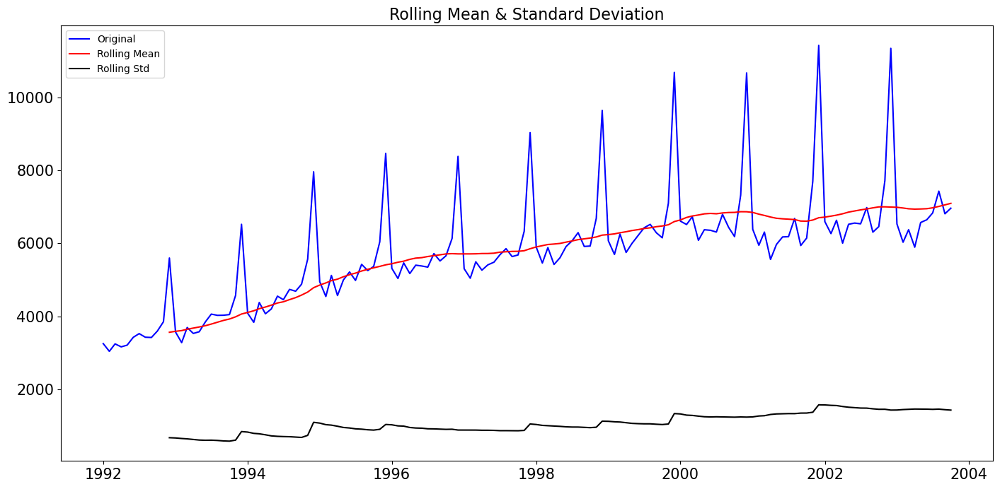

Results of Dickey-Fuller Test:
Test Statistic                  -2.397877
p-value                          0.142337
#Lags Used                      12.000000
Number of Observations Used    129.000000
Critical Value (1%)             -3.482088
Critical Value (5%)             -2.884219
Critical Value (10%)            -2.578864
dtype: float64 



In [365]:
test_stationarity(train['Series 1'])

# We see that at 5% significant level the Time Series is non-stationary.



# Let us take a difference of order 1 and check whether the Time Series is stationary or not.

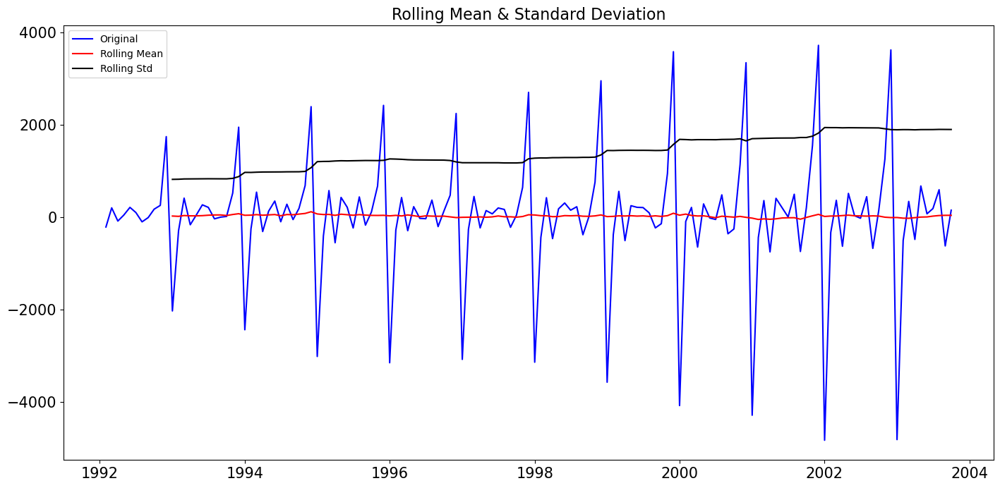

Results of Dickey-Fuller Test:
Test Statistic                  -2.614530
p-value                          0.090031
#Lags Used                      12.000000
Number of Observations Used    128.000000
Critical Value (1%)             -3.482501
Critical Value (5%)             -2.884398
Critical Value (10%)            -2.578960
dtype: float64 



In [366]:
test_stationarity(train['Series 1'].diff().dropna())

We see that at 𝛼 = 0.05 the Time Series is non stationary

# Take second order difference

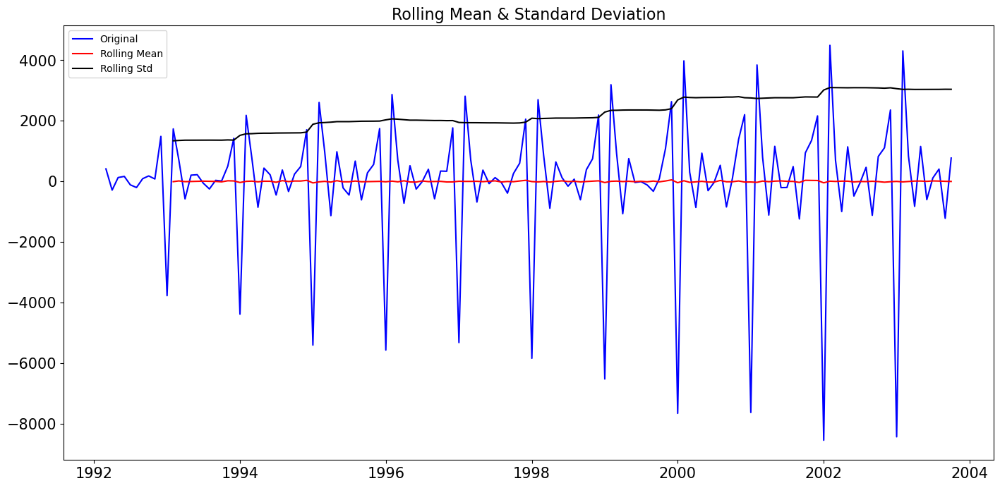

Results of Dickey-Fuller Test:
Test Statistic                -1.294544e+01
p-value                        3.463631e-24
#Lags Used                     1.100000e+01
Number of Observations Used    1.280000e+02
Critical Value (1%)           -3.482501e+00
Critical Value (5%)           -2.884398e+00
Critical Value (10%)          -2.578960e+00
dtype: float64 



In [367]:
# Take second order difference
train_stationary = train['Series 1'].diff().diff().dropna()

# Check stationarity
test_stationarity(train_stationary)


# PLOT ACF AND PACF

In [368]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

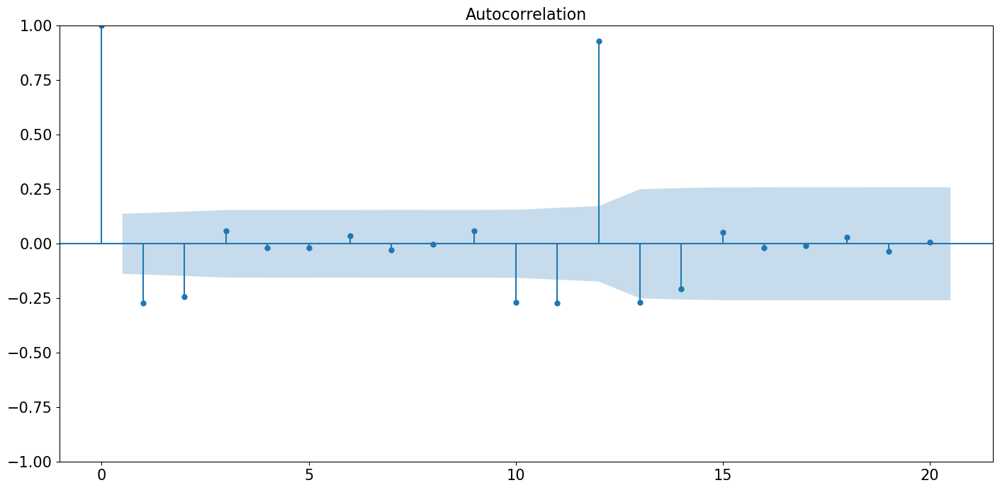

In [369]:
plot_acf(df['Series 1'].diff().dropna(),lags=20)
plt.show()

C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


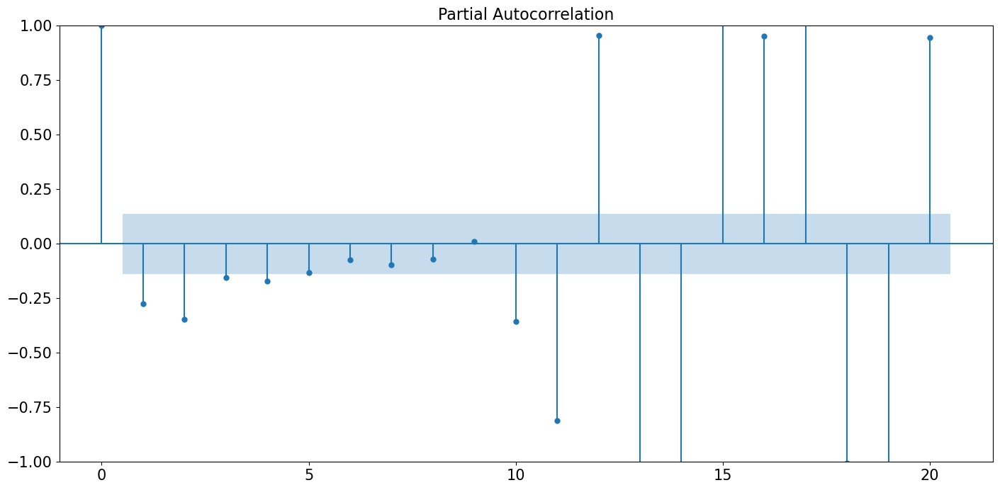

In [370]:
plot_pacf(df['Series 1'].diff().dropna(),lags=20)
plt.show()

# Building an automated version of the ARIMA

# Model 7: Automated ARIMA model

In [371]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p =  range(0, 4)
q = range(0, 2)
d= range(0,1)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 0, 1)
Model: (1, 0, 0)
Model: (1, 0, 1)
Model: (2, 0, 0)
Model: (2, 0, 1)
Model: (3, 0, 0)
Model: (3, 0, 1)


In [372]:
ARIMA_train = train.copy()
ARIMA_test = test.copy()

In [373]:
# Creating an empty Dataframe with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [374]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:
    ARIMA_model = ARIMA(ARIMA_train['Series 1'].values, order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model.aic))
    ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)


ARIMA(0, 0, 0) - AIC:2487.756785073224
ARIMA(0, 0, 1) - AIC:2442.63077246533
ARIMA(1, 0, 0) - AIC:2424.2962184299113


C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1780861169.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1780861169.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1780861169.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)


ARIMA(1, 0, 1) - AIC:2404.054168432275
ARIMA(2, 0, 0) - AIC:2423.431687471436


C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1780861169.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1780861169.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros

ARIMA(2, 0, 1) - AIC:2401.0683009798113
ARIMA(3, 0, 0) - AIC:2414.7100257979737


C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1780861169.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1780861169.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)


ARIMA(3, 0, 1) - AIC:2399.9131755850303


C:\Users\JITENDRA\AppData\Local\Temp\ipykernel_2068\1780861169.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param': param, 'AIC': ARIMA_model.aic}, ignore_index=True)


In [375]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
7,"(3, 0, 1)",2399.913176
5,"(2, 0, 1)",2401.068301
3,"(1, 0, 1)",2404.054168
6,"(3, 0, 0)",2414.710026
4,"(2, 0, 0)",2423.431687
2,"(1, 0, 0)",2424.296218
1,"(0, 0, 1)",2442.630772
0,"(0, 0, 0)",2487.756785


In [376]:
## ARIMA(3,0,1) has the lowest AIC
mod = ARIMA(ARIMA_train['Series 1'], order=(3,0,1))

results_Arima = mod.fit()

print(results_Arima.summary())

C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:               Series 1   No. Observations:                  142
Model:                 ARIMA(3, 0, 1)   Log Likelihood               -1193.957
Date:                Thu, 11 Apr 2024   AIC                           2399.913
Time:                        20:20:34   BIC                           2417.648
Sample:                    01-01-1992   HQIC                          2407.120
                         - 10-01-2003                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5767.4329   1868.150      3.087      0.002    2105.925    9428.940
ar.L1          1.2030      0.131      9.184      0.000       0.946       1.460
ar.L2         -0.3623      0.363     -0.997      0.3

In [377]:
predicted_autoARIMA = results_Arima.forecast(steps=len(test))
predicted_autoARIMA[0]

6886.482117006995

In [378]:
from math import sqrt
from sklearn.metrics import mean_squared_error

# Ensure predicted_autoARIMA is a list or array
if isinstance(predicted_autoARIMA, (int, float)):
    predicted_autoARIMA = [predicted_autoARIMA]

# Calculate RMSE
RMSE_autoARIMA = sqrt(mean_squared_error(ARIMA_test['Series 1'], predicted_autoARIMA))

# Calculate MAPE
def MAPE(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

MAPE_autoARIMA = MAPE(ARIMA_test['Series 1'], predicted_autoARIMA)

print('RMSE for the autofit ARIMA model:', RMSE_autoARIMA)
print('MAPE for the autofit ARIMA model:', MAPE_autoARIMA)


RMSE for the autofit ARIMA model: 2856.839279349714
MAPE for the autofit ARIMA model: 21.223087242888216


In [379]:
resultsDf_7 = pd.DataFrame({'Model':'autoARIMA(3,0,1)', 'Test RMSE': RMSE_autoARIMA,'Test MAPE': MAPE_autoARIMA }
                           ,index=['Model 7'])

resultsDf = pd.concat([resultsDf, resultsDf_7])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780
Model 4.2,"Alpha=0.98,SimpleExponentialSmoothing",3183.921772,26.397564
Model 5.1,"Alpha=0.526316,Beta=0.526316:DoubleExponentialSmoothing",2970.666314,22.589374
Model 6.1,"lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing",155.428322,1.600866


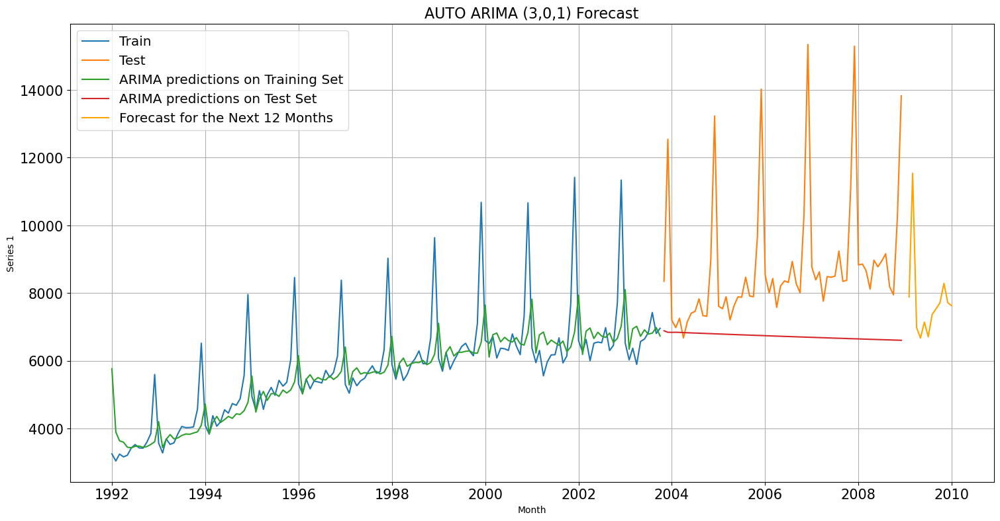

In [382]:
# Assuming ARIMA_train and ARIMA_test are defined previously
# Assuming 'predicted_autoARIMA' contains the forecasted values

# Plotting
plt.figure(figsize=(18, 9))
plt.plot(ARIMA_train['Series 1'], label='Train')
plt.plot(ARIMA_test['Series 1'], label='Test')
plt.plot(ARIMA_train.index, results_Arima.fittedvalues, label='ARIMA predictions on Training Set')
plt.plot(ARIMA_test.index, predicted_autoARIMA, label='ARIMA predictions on Test Set')
plt.plot(pd.date_range(start=ARIMA_test.index[-1], periods=13, freq='M')[1:], forecast_values, label='Forecast for the Next 12 Months', color='orange')

plt.xlabel('Month')
plt.ylabel('Series 1')
plt.title('AUTO ARIMA (3,0,1) Forecast')
plt.legend(loc='best', fontsize='x-large')
plt.grid()
plt.show()


# Generate forecast for next 12 months

In [383]:
# Generate forecast for next 12 months
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='MS')
forecast_values = results_Arima.forecast(steps=12)[0]

# Print the forecast values
forecast_df = pd.DataFrame({'Forecast': forecast_values}, index=forecast_index)
print(forecast_df)


               Forecast
2009-01-01  6886.482117
2009-02-01  6886.482117
2009-03-01  6886.482117
2009-04-01  6886.482117
2009-05-01  6886.482117
2009-06-01  6886.482117
2009-07-01  6886.482117
2009-08-01  6886.482117
2009-09-01  6886.482117
2009-10-01  6886.482117
2009-11-01  6886.482117
2009-12-01  6886.482117


# MODEL 08

# Building ARIMA models based on the cut-off points of ACF and PACF on the training data.

Checking the stationarity of the train data

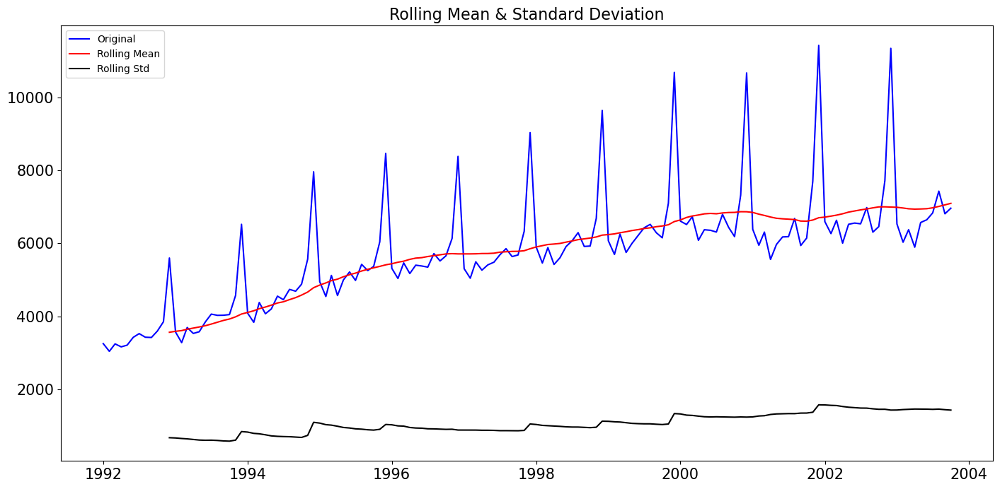

Results of Dickey-Fuller Test:
Test Statistic                  -2.397877
p-value                          0.142337
#Lags Used                      12.000000
Number of Observations Used    129.000000
Critical Value (1%)             -3.482088
Critical Value (5%)             -2.884219
Critical Value (10%)            -2.578864
dtype: float64 



In [384]:
test_stationarity(train['Series 1'])

# We see that the series is not stationary at 𝛼 = 0.05.

Taking first differencing and checking the stationarity again

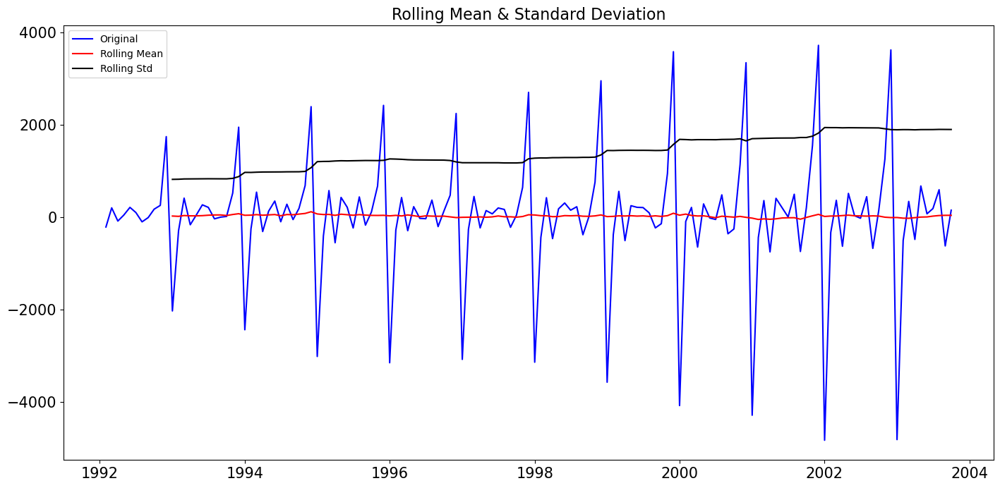

Results of Dickey-Fuller Test:
Test Statistic                  -2.614530
p-value                          0.090031
#Lags Used                      12.000000
Number of Observations Used    128.000000
Critical Value (1%)             -3.482501
Critical Value (5%)             -2.884398
Critical Value (10%)            -2.578960
dtype: float64 



In [385]:
test_stationarity(train['Series 1'].diff().dropna())

# Take second order difference

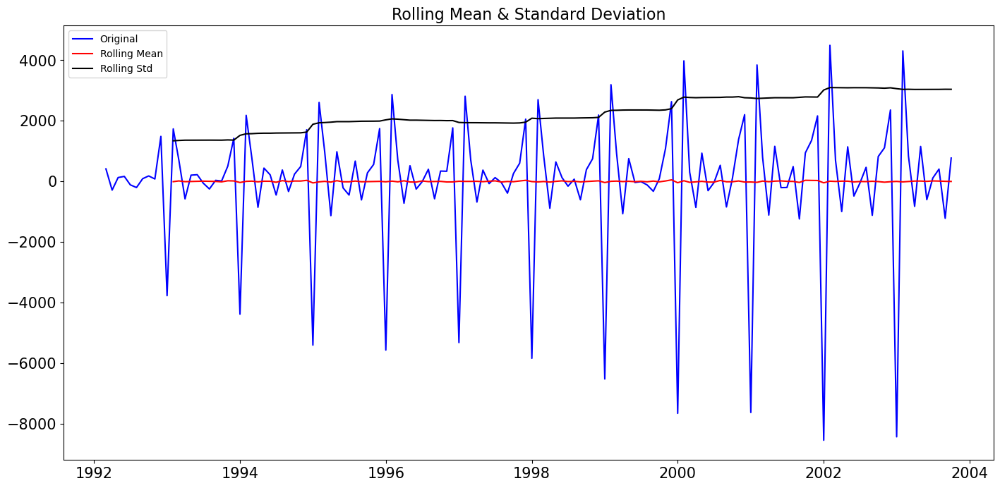

Results of Dickey-Fuller Test:
Test Statistic                -1.294544e+01
p-value                        3.463631e-24
#Lags Used                     1.100000e+01
Number of Observations Used    1.280000e+02
Critical Value (1%)           -3.482501e+00
Critical Value (5%)           -2.884398e+00
Critical Value (10%)          -2.578960e+00
dtype: float64 



In [386]:
# Take second order difference
train_stationary = train['Series 1'].diff().diff().dropna()

# Check stationarity
test_stationarity(train_stationary)


### We see that the after first differencing the series is stationary at 𝛼 = 0.05.

# Let us look at the ACF and PACF plots on the training data.

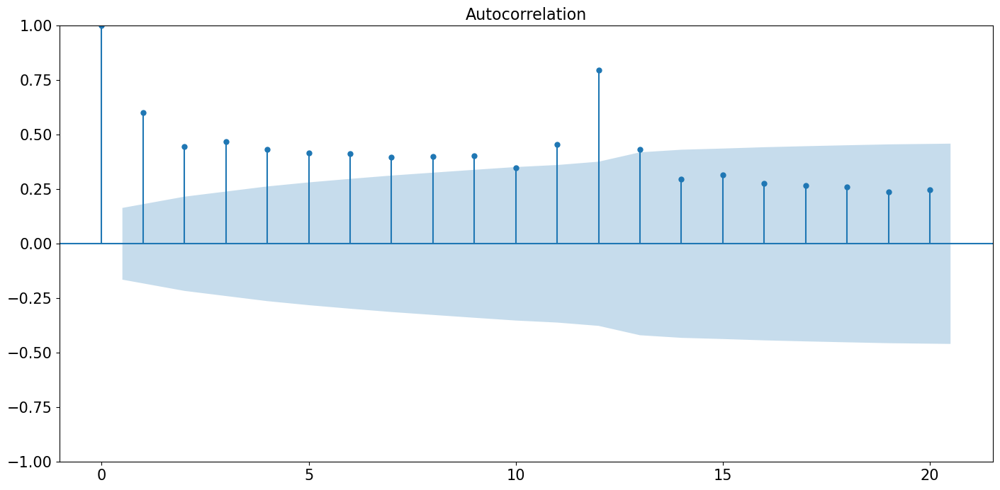

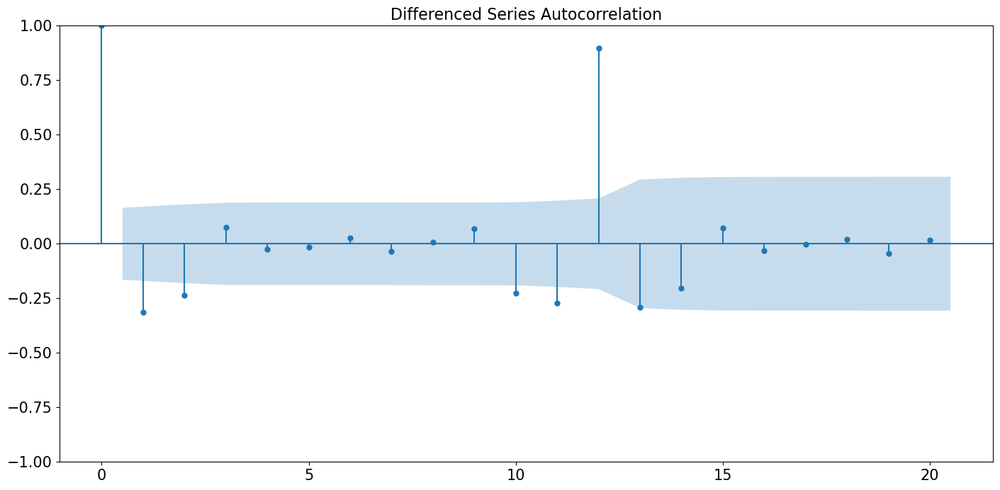

In [387]:
#ACF Plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(train['Series 1'],lags=20)
plot_acf(train['Series 1'].diff().dropna(),lags=20,title='Differenced Series Autocorrelation')
plt.show()



# q= 1,2,10

C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


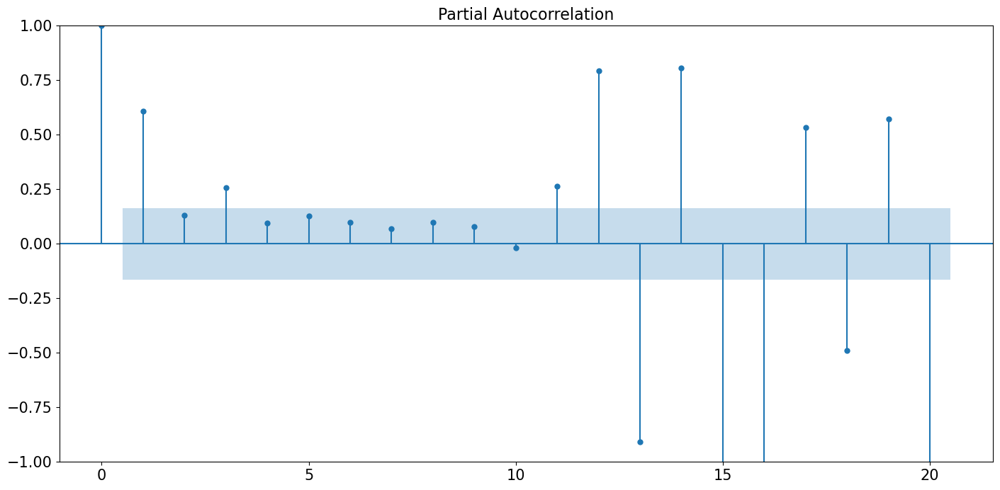

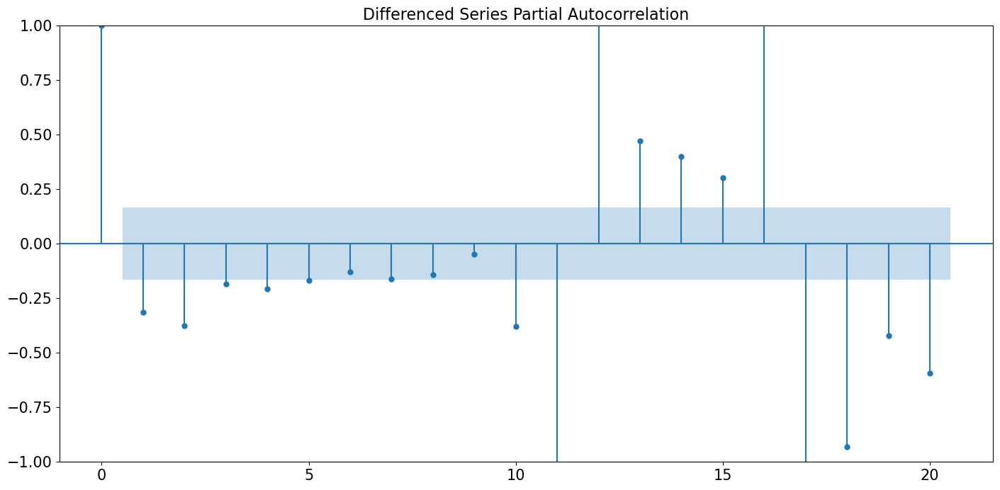

In [388]:
#PACF Plot
plot_pacf(train['Series 1'],lags=20)
plot_pacf(train['Series 1'].diff().dropna(),lags=20,title='Differenced Series Partial Autocorrelation')
plt.show()

In [389]:
import itertools

# Define the values for p, d, and q
p_values = [1, 2, 3, 4]
d_values = [0]
q_values = [1, 2]

# Generate all possible combinations of p, d, and q
arima_orders = list(itertools.product(p_values, d_values, q_values))

# Print the generated combinations
for order in arima_orders:
    print(f"ARIMA Order: {order}")


ARIMA Order: (1, 0, 1)
ARIMA Order: (1, 0, 2)
ARIMA Order: (2, 0, 1)
ARIMA Order: (2, 0, 2)
ARIMA Order: (3, 0, 1)
ARIMA Order: (3, 0, 2)
ARIMA Order: (4, 0, 1)
ARIMA Order: (4, 0, 2)


# ARIMA from acf and pacf plot

In [390]:
from statsmodels.tsa.arima.model import ARIMA

ARIMA_mod = ARIMA(train['Series 1'], order=(1,0,1))

results_ARIMA_mod = ARIMA_mod.fit()

print(results_ARIMA_mod.summary())


                               SARIMAX Results                                
Dep. Variable:               Series 1   No. Observations:                  142
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1198.027
Date:                Thu, 11 Apr 2024   AIC                           2404.054
Time:                        20:33:01   BIC                           2415.877
Sample:                    01-01-1992   HQIC                          2408.859
                         - 10-01-2003                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5767.2146   1725.874      3.342      0.001    2384.564    9149.865
ar.L1          0.9955      0.011     87.591      0.000       0.973       1.018
ma.L1         -0.8659      0.067    -12.898      0.0

C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\JITENDRA\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [391]:
predicted_acf_pacf_ARIMA = results_ARIMA_mod.forecast(steps=len(test))

# Forecasted Values for the Next 12 Months

C:\Users\JITENDRA\anaconda3\lib\site-packages\numpy\core\shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


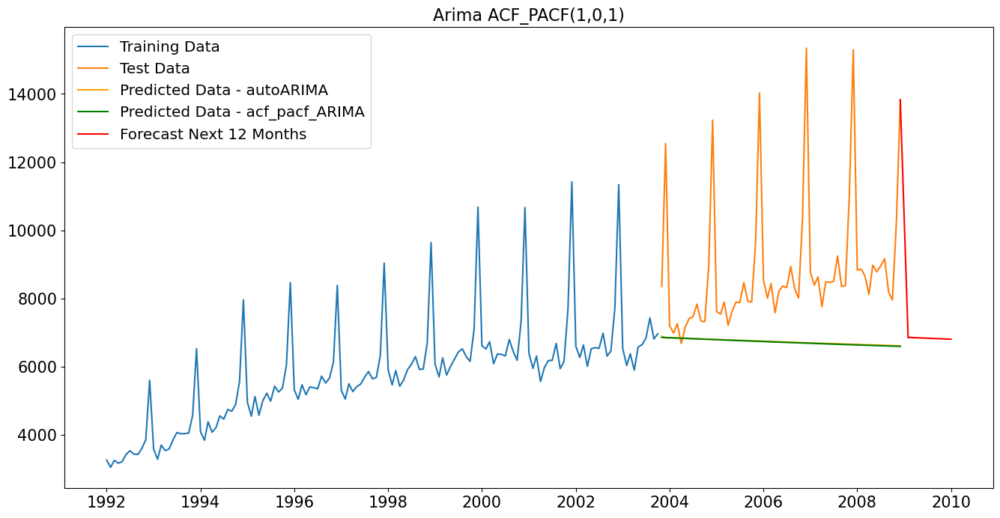

Forecasted Values for the Next 12 Months:
2009-01-31: 6854.891177934336
2009-02-28: 6849.950079287379
2009-03-31: 6845.031427070732
2009-04-30: 6840.135119314721
2009-05-31: 6835.261054512896
2009-06-30: 6830.409131619932
2009-07-31: 6825.57925004953
2009-08-31: 6820.77130967234
2009-09-30: 6815.985210813875
2009-10-31: 6811.220854252451
2009-11-30: 6806.4781412171305
2009-12-31: 6801.756973385668


In [394]:
import numpy as np
import pandas as pd

# Plotting
plt.figure(figsize=(16,8))

# Plotting training and testing data
plt.plot(train, label='Training Data')
plt.plot(test, label='Test Data')

# Plotting predicted data from autoARIMA and ACF_PACF ARIMA
plt.plot(test.index, np.array(predicted_autoARIMA)[:len(test)], label='Predicted Data - autoARIMA', color='orange')
plt.plot(test.index, predicted_acf_pacf_ARIMA, label='Predicted Data - acf_pacf_ARIMA', color='green')

# Forecasting for the next 12 months from January 2009
forecast_index = pd.date_range(start='2009-01-01', periods=12, freq='M')
forecast_values = results_ARIMA_mod.forecast(steps=12)

# Plotting forecasted values
plt.plot(forecast_index, forecast_values, label='Forecast Next 12 Months', color='red')

# Connecting forecast with the last point of the testing data
plt.plot([test.index[-1], forecast_index[0]], [test.values[-1], forecast_values[0]], color='red')

plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.legend(loc='best', fontsize="x-large")
plt.grid()
plt.title('Arima ACF_PACF(1,0,1)')
plt.grid()
plt.show()

# Printing the forecasted values
print("Forecasted Values for the Next 12 Months:")
for date, value in zip(forecast_index, forecast_values):
    print(f"{date.strftime('%Y-%m-%d')}: {value}")


In [398]:
from sklearn import metrics

# Calculate RMSE and MAPE for ARIMA model on the test data
rmse_model8_test = metrics.mean_squared_error(test['Series 1'], predicted_acf_pacf_ARIMA, squared=False)
mape_model8_test = MAPE(test['Series 1'], predicted_acf_pacf_ARIMA)
print("For ARIMA on the Test Data, RMSE is %3.3f and MAPE is %3.2f" % (rmse_model8_test, mape_model8_test))


For ARIMA on the Test Data, RMSE is 2864.582 and MAPE is 21.33


In [399]:
resultsDf_8 = pd.DataFrame({'Model': 'acf_pacf_ARIMA(1,0,1)','Test RMSE': [rmse_model8_test],'Test MAPE': [mape_model8_test]},index=['Model 8'])

resultsDf = pd.concat([resultsDf, resultsDf_8])
resultsDf

,Model,Test RMSE,Test MAPE
Model 1,RegressionOnTime,3907.743273,37.358230
Model 2,NaiveModel,2672.230680,18.594770
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780
Model 4.2,"Alpha=0.98,SimpleExponentialSmoothing",3183.921772,26.397564
Model 5.1,"Alpha=0.526316,Beta=0.526316:DoubleExponentialSmoothing",2970.666314,22.589374
Model 6.1,"lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing",155.428322,1.600866


In [400]:
pd.options.display.max_colwidth = 100
resultsDf.sort_values(by = 'Test RMSE')

,Model,Test RMSE,Test MAPE
Model 6.1,"lpha=0.0526,Beta=0.0526,Gamma=0.5789,TripleExponentialSmoothing",155.428322,1.600866
Model 3.1,2pointTrailingMovingAverage,1138.286865,7.101080
Model 3.2,4pointTrailingMovingAverage,1644.988363,11.430645
Model 3.3,6pointTrailingMovingAverage,1769.484710,12.402349
Model 3.4,9pointTrailingMovingAverage,1853.124620,11.391648
Model 2,NaiveModel,2672.230680,18.594770
Model 4.1,"Alpha=0.295531,SimpleExponentialSmoothing",2720.236974,19.357780
Model 7,"autoARIMA(3,0,1)",2856.839279,21.223087
Model 8,"acf_pacf_ARIMA(1,0,1)",2864.581847,21.331618
Model 5.1,"Alpha=0.526316,Beta=0.526316:DoubleExponentialSmoothing",2970.666314,22.589374


# MODEL 9    SARIMA MODEL